In [1]:
import os
from tempfile import tempdir
from time import time
from turtle import color
from unittest.mock import NonCallableMagicMock
import pandas as pd
import numpy as np
import warnings
import math
import re

import seaborn as sns
warnings.filterwarnings("ignore")

import sys
sys.path.append("./")

from pathlib import Path

import tqdm
import importlib

import matplotlib.pyplot as plt
# from PySide2.QtWidgets import QFileDialog, QApplication
# from PySide2.QtCore import Qt
from copy import copy 

from corems.mass_spectra.input import rawFileReader
from corems.molecular_id.factory.classification import HeteroatomsClassification, Labels
from corems.molecular_id.search.priorityAssignment import OxygenPriorityAssignment
from corems.molecular_id.search.molecularFormulaSearch import SearchMolecularFormulas
from corems.encapsulation.factory.parameters import MSParameters
from corems.encapsulation.constant import Atoms
from corems.mass_spectrum.calc.Calibration import MzDomainCalibration

import importlib

import corems.lc_icpms_ftms.calc.lc_icrms_qc_assign as icrms

importlib.reload(icrms)



<module 'corems.lc_icpms_ftms.calc.lc_icrms_qc_assign' from '/Users/christiandewey/CoreMS/corems/lc_icpms_ftms/calc/lc_icrms_qc_assign.py'>

In [2]:
def getParser(file):
    parser = rawFileReader.ImportMassSpectraThermoMSFileReader(file)
    return parser

def assign_formula(parser, interval, timerange, refmasslist=None):
    #Function to build formula assignment lists
    #Retrieve TIC for MS1 scans over the time range between 'timestart' and 'timestop' 

    tic=parser.get_tic(ms_type='MS')[0]
    tic_df=pd.DataFrame({'time': tic.time,'scan': tic.scans})

    times=list(range(timerange[0],timerange[1],interval))

    results=[]
    
    for timestart in times:

        scans=tic_df[tic_df.time.between(timestart,timestart+interval)].scan.tolist()

        mass_spectrum = parser.get_average_mass_spectrum_by_scanlist(scans)    
        mass_spectrum.molecular_search_settings.ion_charge = 1

        #mass_spectrum.mass_spectrum.settings.calib_sn_threshold
        #mass_spectrum.mass_spectrum.settings.calib_pol_order
        #mass_spectrum.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)
        #MzDomainCalibration(mass_spectrum, ref_file_location).run()

        if refmasslist:
            mass_spectrum.settings.min_calib_ppm_error = 10
            mass_spectrum.settings.max_calib_ppm_error = -10
            calfn = MzDomainCalibration(mass_spectrum, refmasslist)
            ref_mass_list_fmt = calfn.load_ref_mass_list(refmasslist)

            imzmeas, mzrefs = calfn.find_calibration_points(mass_spectrum, ref_mass_list_fmt,
                                                        calib_ppm_error_threshold=(0, 2.0),
                                                        calib_snr_threshold=3)

            calfn.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)


        SearchMolecularFormulas(mass_spectrum, first_hit=False).run_worker_mass_spectrum()

        mass_spectrum.percentile_assigned(report_error=True)

        assignments=mass_spectrum.to_dataframe()

        assignments['Time']=timestart

        results.append(assignments)
    
    results=pd.concat(results,ignore_index=True)

    return(results)    

def plot_ms(df1, start_mz, end_mz, tstart, df2=None,df3=None, assignment= None, ax_ms=None, lbls=None, norm=False, labs=False, colors=None):   
    if ax_ms == None:
        f, ax = plt.subplots()
    
    else:
        ax = ax_ms

    if colors is not None:
        cols = colors
    else:
        cols = ['C0', 'C1', 'C2']
    mzrange= end_mz - start_mz
    ms_t_int=df1[df1['Time'] == tstart]
    ms_df = ms_t_int[((ms_t_int['Calibrated m/z']-start_mz)<mzrange) & ((ms_t_int['Calibrated m/z']-start_mz)>0)]

    maxdf1 = max(ms_df['S/N'])

    if norm:
        ms_df['S/N Norm'] = ms_df['S/N'] / maxdf1
    else:
        ms_df['S/N Norm'] = ms_df['S/N'] 

    

    print(ms_df['S/N Norm'])

    if lbls is not None:
        labels = lbls
    else:
        lbls = [None, None, None]

 
    _, stemlines1, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df,  markerfmt=' ', basefmt=' ', linefmt=cols[0], label = labels[0])
    
    if df2 is not None:
        ms_t_int2=df2[df2['Time'] == tstart]
        ms_df2 = ms_t_int2[(abs(ms_t_int2['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int2['Calibrated m/z']-start_mz)>0)]

        maxdf2 = max(ms_df2['S/N'])

        if norm:
            ms_df2['S/N Norm'] = ms_df2['S/N'] / maxdf2
        else:
            ms_df2['S/N Norm'] = ms_df2['S/N'] 
        
        _, stemlines2, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df2,  markerfmt=' ', basefmt=' ', linefmt=cols[1], label = labels[1])

    if df3 is not None:
        ms_t_int3=df3[df3['Time'] == tstart]
        ms_df3 = ms_t_int3[(abs(ms_t_int3['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int3['Calibrated m/z']-start_mz)>0)]

        maxdf3 = max(ms_df3['S/N'])

        if norm:
            ms_df3['S/N Norm'] = ms_df3['S/N'] / maxdf3
        else:
            ms_df3['S/N Norm'] = ms_df3['S/N'] 
        
        _, stemlines3, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df3,  markerfmt=' ', basefmt=' ', linefmt=cols[2], label = labels[2])
    
    if df3 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2, maxdf3]) * 1.1)
    elif df2 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2]) * 1.1)
    else: 
        ax.set_ylim(0, maxdf1 * 1.1)

    ax.set_xlim(left = start_mz - mzrange*0.1, right = start_mz + mzrange + mzrange*0.1) 

    if labs:
        for mzr,peakr,mf,er in zip(ms_df['Calibrated m/z'], ms_df['S/N Norm'], ms_df['Molecular Formula'],  ms_df['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

            mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
            ax.text(mzr, peakr + 0.02 *max(ms_df['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color=cols[0])

        if df2 is not None:

            for mzr,peakr,mf, er in zip(ms_df2['Calibrated m/z'], ms_df2['S/N Norm'], ms_df2['Molecular Formula'], ms_df2['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df2['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[1])

        if df3 is not None:

            for mzr,peakr,mf, er in zip(ms_df3['Calibrated m/z'], ms_df3['S/N Norm'], ms_df3['Molecular Formula'], ms_df3['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df3['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[2])

   # theor_mz=pattern.mdiff+result['mass']
   # theor_int=pattern.ratio*result['abundance']
   # ax.stem(theor_mz,theor_int, basefmt=' ',linefmt='gray')

   # for isotope in pattern.isotope[pattern.requirement=='Y']:
   #     ax.stem('mz','intense',data=result[isotope],  markerfmt=' ', basefmt=' ',linefmt='red')
    if ax == None:

        ax.legend(('other', 'target'),bbox_to_anchor=(1.05, 1.0), loc='upper left',frameon=False)

        if(assignment):

            mf = assignment[0]
            score = assignment[1]
            er = assignment[2]

            ax.text(1.05,0.7,mf,transform=ax.transAxes)
            ax.text(1.05,0.6,'Error (ppm) = %.3f ' %er ,transform=ax.transAxes)
            ax.text(1.05,0.5,'Score = %.3f' %score ,transform=ax.transAxes)

    if norm: 
        ax.set(xlabel='Calibrated m/z',ylabel='Normalized S/N')
    else: 
        ax.set(xlabel='Calibrated m/z',ylabel='S/N')
    #ax.set_title('%.2f' %timerange[0] + ' to %.2f' %timerange[1] +' min', fontsize = 'medium')
    ax.legend(bbox_to_anchor = (1.00, 0.5), frameon =False, loc = 'center left')
    ax.axhline(y=0.0, color='black')
    plt.setp(stemlines1,'color', cols[0], 'linewidth', 2)
    if df2 is not None:
        plt.setp(stemlines2, 'color', cols[1],'linewidth', 2)
    if df3 is not None:
        plt.setp(stemlines3, 'color', cols[2],'linewidth', 2)
    plt.tight_layout()
    if ax_ms == None:
        return ax


def filterMzRange(results, mz_range):

    mz_i = mz_range[0]
    mz_f = mz_range[1]

    sub = results[(results['m/z'] >= mz_i) & (results['m/z'] <= mz_f)]

    return sub



In [3]:
def pltMZerror(results, bins=50):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        counts, bins = np.histogram(np.asarray(results[results['mol_class']==mol_class]['m/z Error (ppm)']),bins = bins)

        ax.plot(bins[:-1], counts, label = mol_class)

    ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False)
    ax.set_xlabel('m/z assignment error (ppm)')
    ax.set_ylabel('# assigned features')

    return ax

def pltMZerror_pts(results):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        ax.scatter(results[results['mol_class']==mol_class]['Calibrated m/z'], results[results['mol_class']==mol_class]['m/z Error (ppm)'], label = mol_class)

    ax.set_xlim(200,1200)
    ax.legend(frameon=False,bbox_to_anchor=(1.0, 0.5))
    ax.set_xlabel('calibrated m/z')
    ax.set_ylabel('assignment error (ppm)')

    return ax


In [20]:
def assignMolClass(resultsdf, mz_cutoff = 800, sn_lim = 3):

    filtered_results=resultsdf[(resultsdf['m/z']<mz_cutoff) & (resultsdf['S/N']>sn_lim)]

    filtered_results['N']=filtered_results['N'].fillna(0)
    filtered_results['O']=filtered_results['O'].fillna(0)
    #filtered_results['S']=filtered_results['S'].fillna(0)
    #filtered_results['P']=filtered_results['Fe'].fillna(0)
    filtered_results['Cu']=filtered_results['Cu'].fillna(0)

    filtered_results['mol_class']='Unassigned'
    filtered_results['mol_class'][filtered_results['C']>0]='CHO'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['N']>0.5)]='CHON'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['S']>0.5)]='CHOS'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Fe']>0.5)]='CHOFe'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5)]='CHOCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['N']>0.5)]='CHONCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['S']>0.5)]='CHOSCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONNa'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['P']>0.5) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONPNa'


    results= filtered_results #[filtered_results['mol_class'] != 'Unassigned'] #[filtered_results['Is Isotopologue']==0]
    results['N/C']=results['O']/results['C']
    results['H/C']=results['H']/results['C']
    results['N/C']=results['N']/results['C']

    return results



In [5]:
def add_mzwindow_col(df):    

    df['m/z window'] = df.index
    
    
    for file, r in zip(df['file'], range(len(df['file']))):

        if ('400_500' in file) or ('400-500' in file):

            df['m/z window'].iloc[r] = '400-500 m/z'

        elif ('500_600' in file) or ('500-600' in file):

            df['m/z window'].iloc[r] = '500-600 m/z'
    
        elif ('600_700' in file) or ('600-700' in file):

            df['m/z window'].iloc[r] = '600-700 m/z'

        elif ('700_800' in file) or ('700-800' in file):

            df['m/z window'].iloc[r] = '700-800 m/z'

        elif ('400_600' in file) or ('400-600' in file):

            df['m/z window'].iloc[r] = '400-600 m/z'
        
        elif ('600_800' in file) or ('600-800' in file):

            df['m/z window'].iloc[r] = '600-800 m/z'
            
        elif 'full' in file:

            df['m/z window'].iloc[r] = '200-1200 m/z'

    return df 

In [6]:
def getUniqueFeatures(df):    
    #Create a list of all unique features and describe their intensity. 
    print('total # results: %s' %len(df))
    #define a list of unique features (time, formula) with 'areas' determined for each sample. There may be a slight bug that causes the unique list to grow...
    uniquelist=[]
    for time in df.Time.unique():
        current=df[df.Time==time]
        current=current.sort_values(by=['m/z Error (ppm)'],ascending=True)
        currentunique=current.drop_duplicates(subset=['Molecular Formula'])
        currentunique=currentunique[currentunique['C']>1]
        currentunique=currentunique.set_index(['Molecular Formula'],drop=False)
        for file in df['file'].unique():
            current_file=current[current['file']==file].drop_duplicates(subset=['Molecular Formula'])
            current_file=current_file.rename(columns={'Peak Height':file})
            current_file=current_file.set_index(['Molecular Formula'],drop=False)
            #current_file[file].fillna(0)
            currentunique=currentunique.join(current_file[file])
        uniquelist.append(currentunique)

    unique_results=pd.concat(uniquelist,ignore_index=True)
    unique_results['N/C']=unique_results['N']/unique_results['C']
    #unique_results['blank']=unique_results[blankfile]/unique_results['Peak Height']
    #unique_results=unique_results[unique_results['blank']<blnk_thresh]


    print('# unique results: %s' %len(unique_results))

    return unique_results


In [81]:
def plotUnique(df,ps=50,includeBlanks=False, xlim = [400,600]):
    xmin = xlim[0]
    xmax = xlim[1]
    if includeBlanks != True:
        mask = ~df['file'].str.contains('qh2o', case=False, na=False)
        df=df[mask]
    else:
        df=df
    fig, ((ax2, ax4),(ax3, ax1)) = plt.subplots(2,2,figsize = (12,12))
    sns.scatterplot(x='m/z',y='m/z Error (ppm)',data=df[df['Cu']>0],hue='m/z window', s=ps*4, ax=ax1)
    sns.scatterplot(x='m/z',y='m/z Error (ppm)', hue='m/z window', data=df, ax=ax2,s=ps)
    ax1.set_xlim(xmin,xmax)
    ax2.set_xlim(xmin,xmax)
    sns.scatterplot(x='m/z',y='m/z Error (ppm)',hue='N',data=df,ax=ax3,s=ps)
    sns.scatterplot(x='m/z',y='Resolving Power',hue='mol_class',data=df,ax=ax4)
    
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_title('Assignment error, Cu features')
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_title('Overall assignment error')
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax3.set_title('Assignment error, N features')
    ax4.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax4.set_title('Resolving power v. m/z')

    #fig.savefig('unique_results.pdf', bbox_to_inches='tight')

    return fig

    

In [8]:
def addRepCol(data_df):

    data_df['Rep'] = data_df.index


    for file in data_df['file'].unique():

        print(file)

        if 'rep2' in file:

            temp = data_df[data_df['file'] == file]
            temp['Rep'] = 2
            data_df[data_df['file'] == file] = temp


        else:

            temp = data_df[data_df['file'] == file]
            temp['Rep'] = 1
            data_df[data_df['file'] == file] = temp

    print(data_df['Rep'].unique())


    return data_df 

In [9]:
def blankSubtract(df, blnkthresh = 0.9):
    
    holder = []
    for file in df['file'].unique():
        
        sub = df[df['file'] == file]

        blkf = sub['blank file'].iloc[0]


        sub[sub[file]== np.nan] = 0

        nom = sub[file]
        den = sub[blkf]

        nom = nom.replace(np.nan,0)
        den = den.replace(np.nan,1)

        if file != blkf:
            nom = nom
        elif file == blkf:
            nom = nom * (blnkthresh*0.8)

        sub['blank subtract'] = nom/den
        holder.append(sub)
    df_end = pd.concat(holder)
    df_end = df_end[df_end['blank subtract'] > blnkthresh]
    return df_end

In [10]:
#import data
#dir = 'C:\\Users\\deweyc\Box\\Boiteau Lab\\Mass Spec Data\\21T at NHMFL\\2022-10 Nicole & Christian\\Christian\\spring-a'
dir='/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/21T at NHMFL/2022-10 Nicole & Christian/Christian/spring/lowmz'
#file_location='/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/21T at NHMFL/2021_August_OC2102A/OC2012A/'
flist=os.listdir(dir)
os.chdir(dir)

print(flist)
MSfiles={}

for f in flist:
    if '.raw' in f:
        print(f)
        parser = rawFileReader.ImportMassSpectraThermoMSFileReader(f)
        MSfiles[f]={'parser': parser}


['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw', 'all_results.pdf', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw', 'db', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw']
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
2

In [11]:
data = icrms.lc_icr_assign(dir)

data.master_data_holder = MSfiles

print(data.master_data_holder.keys())
data._raw_filelist = data.master_data_holder.keys()


dict_keys(['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw', '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw'])


In [12]:
# set assignment parameters
MSParameters.mass_spectrum.threshold_method = 'signal_noise'
MSParameters.mass_spectrum.s2n_threshold = 2
MSParameters.ms_peak.peak_min_prominence_percent = 0.001

MSParameters.molecular_search.error_method = 'None'
MSParameters.molecular_search.min_ppm_error = -0.2
MSParameters.molecular_search.max_ppm_error = 0.2

MSParameters.molecular_search.isProtonated = True
MSParameters.molecular_search.isRadical = False
MSParameters.molecular_search.isAdduct = False

MSParameters.molecular_search.score_method = "prob_score"
MSParameters.molecular_search.output_score_method = "prob_score"


MSParameters.molecular_search.url_database = None
MSParameters.molecular_search.min_dbe = -1
MSParameters.molecular_search.max_dbe = 20

MSParameters.molecular_search.usedAtoms['C'] = (1,50)
MSParameters.molecular_search.usedAtoms['H'] = (4,100)
MSParameters.molecular_search.usedAtoms['O'] = (1,20)
MSParameters.molecular_search.usedAtoms['N'] = (0,4)
MSParameters.molecular_search.usedAtoms['Cu'] = (0,1)
#MSParameters.molecular_search.usedAtoms['S'] = (0,1)

In [13]:
# run assignment algorithm
timerange = [2,30]  # start (min) to stop (min)
interval = 2  # min 
refmasslist = "/Users/christiandewey/CoreMS/tests/tests_data/ftms/nom_pos.ref"

data.assign_formula(interval = interval, timerange = timerange, refmasslist = refmasslist)




20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
1 of 14 files
timestart: 4
MS Obj loaded - 1338 peaks found.
MS Obj loaded - 1338 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.


100%|██████████| 100/100 [00:00<00:00, 957.09it/s]

Started database insert using 2622 iterations for a total of 131100 rows



2622it [00:04, 651.00it/s]


'runworker'  4410.28 ms


Loading molecular formula database: 168198it [00:06, 26449.90it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 140.16it/s]


'run_molecular_formula'  12290.43 ms
575 assigned peaks and 763 unassigned peaks, total  = 42.97 %, relative abundance = 39.15 %, RMS error (best candidate) (ppm) = 0.085
timestart: 6
MS Obj loaded - 2608 peaks found.
MS Obj loaded - 2608 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
14 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.032 ppm
minimize function performed 264 fn evals and 3 iterations
'runworker'  5.13 ms


Loading molecular formula database: 168198it [00:07, 23032.74it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 73.21it/s]


'run_molecular_formula'  10156.58 ms
1406 assigned peaks and 1202 unassigned peaks, total  = 53.91 %, relative abundance = 58.04 %, RMS error (best candidate) (ppm) = 0.067
timestart: 8
MS Obj loaded - 3507 peaks found.
MS Obj loaded - 3507 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
72 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 168 fn evals and 2 iterations
'runworker'  4.99 ms


Loading molecular formula database: 168198it [00:07, 22010.08it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 52.70it/s]


'run_molecular_formula'  11576.62 ms
1943 assigned peaks and 1564 unassigned peaks, total  = 55.40 %, relative abundance = 62.40 %, RMS error (best candidate) (ppm) = 0.044
timestart: 10
MS Obj loaded - 3843 peaks found.
MS Obj loaded - 3843 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
173 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  5.58 ms


Loading molecular formula database: 168198it [00:07, 21856.50it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 47.99it/s]


'run_molecular_formula'  12009.53 ms
2332 assigned peaks and 1511 unassigned peaks, total  = 60.68 %, relative abundance = 70.35 %, RMS error (best candidate) (ppm) = 0.036
timestart: 12
MS Obj loaded - 4248 peaks found.
MS Obj loaded - 4248 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
199 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  5.01 ms


Loading molecular formula database: 168198it [00:07, 21176.94it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 40.78it/s]


'run_molecular_formula'  12946.33 ms
2658 assigned peaks and 1590 unassigned peaks, total  = 62.57 %, relative abundance = 74.25 %, RMS error (best candidate) (ppm) = 0.036
timestart: 14
MS Obj loaded - 4577 peaks found.
MS Obj loaded - 4577 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
235 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 320 fn evals and 6 iterations
'runworker'  4.93 ms


Loading molecular formula database: 168198it [00:08, 20911.50it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 41.04it/s]


'run_molecular_formula'  13073.30 ms
2987 assigned peaks and 1590 unassigned peaks, total  = 65.26 %, relative abundance = 78.42 %, RMS error (best candidate) (ppm) = 0.038
timestart: 16
MS Obj loaded - 4580 peaks found.
MS Obj loaded - 4580 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
251 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  5.07 ms


Loading molecular formula database: 168198it [00:08, 20662.51it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 41.00it/s]


'run_molecular_formula'  13172.93 ms
2944 assigned peaks and 1636 unassigned peaks, total  = 64.28 %, relative abundance = 80.65 %, RMS error (best candidate) (ppm) = 0.046
timestart: 18
MS Obj loaded - 5111 peaks found.
MS Obj loaded - 5111 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
267 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 3034 fn evals and 69 iterations
'runworker'  5.10 ms


Loading molecular formula database: 168198it [00:08, 20180.33it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:05<00:00, 36.57it/s]


'run_molecular_formula'  13961.97 ms
3303 assigned peaks and 1808 unassigned peaks, total  = 64.63 %, relative abundance = 81.97 %, RMS error (best candidate) (ppm) = 0.046
timestart: 20
MS Obj loaded - 4924 peaks found.
MS Obj loaded - 4924 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
259 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 325 fn evals and 6 iterations
'runworker'  5.18 ms


Loading molecular formula database: 168198it [00:07, 21546.09it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:05<00:00, 38.21it/s]


'run_molecular_formula'  13202.25 ms
3292 assigned peaks and 1632 unassigned peaks, total  = 66.86 %, relative abundance = 82.94 %, RMS error (best candidate) (ppm) = 0.050
timestart: 22
MS Obj loaded - 3750 peaks found.
MS Obj loaded - 3750 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
227 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 480 fn evals and 10 iterations
'runworker'  5.07 ms


Loading molecular formula database: 168198it [00:07, 21525.68it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 50.88it/s]


'run_molecular_formula'  11877.05 ms
2828 assigned peaks and 922 unassigned peaks, total  = 75.41 %, relative abundance = 84.63 %, RMS error (best candidate) (ppm) = 0.038
timestart: 24
MS Obj loaded - 3158 peaks found.
MS Obj loaded - 3158 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 328 fn evals and 6 iterations
'runworker'  5.12 ms


Loading molecular formula database: 168198it [00:07, 22462.39it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 58.24it/s]


'run_molecular_formula'  11053.94 ms
2387 assigned peaks and 771 unassigned peaks, total  = 75.59 %, relative abundance = 82.70 %, RMS error (best candidate) (ppm) = 0.031
timestart: 26
MS Obj loaded - 4022 peaks found.
MS Obj loaded - 4022 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
197 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 376 fn evals and 8 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:07, 21136.03it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 48.97it/s]


'run_molecular_formula'  12177.97 ms
2548 assigned peaks and 1474 unassigned peaks, total  = 63.35 %, relative abundance = 73.26 %, RMS error (best candidate) (ppm) = 0.042
timestart: 28
MS Obj loaded - 1797 peaks found.
MS Obj loaded - 1797 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.154 ppm
minimize function performed 263 fn evals and 3 iterations
'runworker'  4.84 ms


Loading molecular formula database: 168198it [00:07, 23433.85it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 112.07it/s]


'run_molecular_formula'  9078.30 ms
951 assigned peaks and 846 unassigned peaks, total  = 52.92 %, relative abundance = 53.37 %, RMS error (best candidate) (ppm) = 0.049


20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
2 of 14 files
timestart: 4
MS Obj loaded - 1022 peaks found.
MS Obj loaded - 1022 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.72 ms


Loading molecular formula database: 168198it [00:04, 35906.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 212.21it/s]


'run_molecular_formula'  5668.24 ms
39 assigned peaks and 983 unassigned peaks, total  = 3.82 %, relative abundance = 1.09 %, RMS error (best candidate) (ppm) = 0.174
timestart: 6
MS Obj loaded - 1654 peaks found.
MS Obj loaded - 1654 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.02 ms


Loading molecular formula database: 168198it [00:04, 34954.34it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 124.53it/s]


'run_molecular_formula'  6456.28 ms
860 assigned peaks and 794 unassigned peaks, total  = 52.00 %, relative abundance = 57.64 %, RMS error (best candidate) (ppm) = 0.121
timestart: 8
MS Obj loaded - 2021 peaks found.
MS Obj loaded - 2021 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.001 ppm
minimize function performed 181 fn evals and 2 iterations
'runworker'  5.35 ms


Loading molecular formula database: 168198it [00:04, 35695.53it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 96.78it/s] 


'run_molecular_formula'  6820.25 ms
1137 assigned peaks and 884 unassigned peaks, total  = 56.26 %, relative abundance = 64.43 %, RMS error (best candidate) (ppm) = 0.076
timestart: 10
MS Obj loaded - 2086 peaks found.
MS Obj loaded - 2086 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
49 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 625 fn evals and 9 iterations
'runworker'  5.38 ms


Loading molecular formula database: 168198it [00:05, 32742.32it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 92.43it/s]


'run_molecular_formula'  7341.91 ms
1258 assigned peaks and 828 unassigned peaks, total  = 60.31 %, relative abundance = 67.88 %, RMS error (best candidate) (ppm) = 0.044
timestart: 12
MS Obj loaded - 2358 peaks found.
MS Obj loaded - 2358 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
90 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 393 fn evals and 7 iterations
'runworker'  5.43 ms


Loading molecular formula database: 168198it [00:04, 37578.30it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 86.59it/s]


'run_molecular_formula'  6824.17 ms
1432 assigned peaks and 926 unassigned peaks, total  = 60.73 %, relative abundance = 72.54 %, RMS error (best candidate) (ppm) = 0.043
timestart: 14
MS Obj loaded - 2606 peaks found.
MS Obj loaded - 2606 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:04, 34556.07it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 80.38it/s]


'run_molecular_formula'  7394.35 ms
1572 assigned peaks and 1034 unassigned peaks, total  = 60.32 %, relative abundance = 76.57 %, RMS error (best candidate) (ppm) = 0.046
timestart: 16
MS Obj loaded - 2498 peaks found.
MS Obj loaded - 2498 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
116 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  4.91 ms


Loading molecular formula database: 168198it [00:04, 35936.00it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 83.09it/s]


'run_molecular_formula'  7125.17 ms
1555 assigned peaks and 943 unassigned peaks, total  = 62.25 %, relative abundance = 79.02 %, RMS error (best candidate) (ppm) = 0.041
timestart: 18
MS Obj loaded - 2429 peaks found.
MS Obj loaded - 2429 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
120 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 377 fn evals and 7 iterations
'runworker'  5.33 ms


Loading molecular formula database: 168198it [00:04, 36769.64it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 83.73it/s]


'run_molecular_formula'  7004.03 ms
1573 assigned peaks and 856 unassigned peaks, total  = 64.76 %, relative abundance = 81.99 %, RMS error (best candidate) (ppm) = 0.046
timestart: 20
MS Obj loaded - 2374 peaks found.
MS Obj loaded - 2374 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
117 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  5.06 ms


Loading molecular formula database: 168198it [00:04, 35067.71it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 84.27it/s]


'run_molecular_formula'  7207.79 ms
1593 assigned peaks and 781 unassigned peaks, total  = 67.10 %, relative abundance = 83.85 %, RMS error (best candidate) (ppm) = 0.043
timestart: 22
MS Obj loaded - 2363 peaks found.
MS Obj loaded - 2363 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
112 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 366 fn evals and 7 iterations
'runworker'  5.18 ms


Loading molecular formula database: 168198it [00:04, 35431.71it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 86.21it/s]


'run_molecular_formula'  7104.77 ms
1641 assigned peaks and 722 unassigned peaks, total  = 69.45 %, relative abundance = 84.79 %, RMS error (best candidate) (ppm) = 0.044
timestart: 24
MS Obj loaded - 1820 peaks found.
MS Obj loaded - 1820 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
97 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 375 fn evals and 7 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:04, 35346.63it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 110.66it/s]


'run_molecular_formula'  6603.80 ms
1333 assigned peaks and 487 unassigned peaks, total  = 73.24 %, relative abundance = 85.17 %, RMS error (best candidate) (ppm) = 0.036
timestart: 26
MS Obj loaded - 2265 peaks found.
MS Obj loaded - 2265 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
100 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  5.01 ms


Loading molecular formula database: 168198it [00:04, 35956.43it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 88.74it/s]


'run_molecular_formula'  6960.49 ms
1397 assigned peaks and 868 unassigned peaks, total  = 61.68 %, relative abundance = 76.64 %, RMS error (best candidate) (ppm) = 0.049
timestart: 28
MS Obj loaded - 1123 peaks found.
MS Obj loaded - 1123 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
41 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 847 fn evals and 12 iterations
'runworker'  5.02 ms


Loading molecular formula database: 168198it [00:04, 33935.15it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 182.91it/s]


'run_molecular_formula'  6087.81 ms
663 assigned peaks and 460 unassigned peaks, total  = 59.04 %, relative abundance = 52.91 %, RMS error (best candidate) (ppm) = 0.035


20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
3 of 14 files
timestart: 4
MS Obj loaded - 1268 peaks found.
MS Obj loaded - 1268 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  4.98 ms


Loading molecular formula database: 168198it [00:05, 32448.62it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 154.77it/s]


'run_molecular_formula'  6543.71 ms
34 assigned peaks and 1234 unassigned peaks, total  = 2.68 %, relative abundance = 0.72 %, RMS error (best candidate) (ppm) = 0.162
timestart: 6
MS Obj loaded - 2128 peaks found.
MS Obj loaded - 2128 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  67.35 ms


Loading molecular formula database: 168198it [00:05, 30432.92it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 89.06it/s]


'run_molecular_formula'  7900.22 ms
1079 assigned peaks and 1049 unassigned peaks, total  = 50.70 %, relative abundance = 54.25 %, RMS error (best candidate) (ppm) = 0.126
timestart: 8
MS Obj loaded - 2816 peaks found.
MS Obj loaded - 2816 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 275 fn evals and 3 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:05, 30526.61it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 66.69it/s]


'run_molecular_formula'  8575.17 ms
1427 assigned peaks and 1389 unassigned peaks, total  = 50.67 %, relative abundance = 55.10 %, RMS error (best candidate) (ppm) = 0.112
timestart: 10
MS Obj loaded - 3077 peaks found.
MS Obj loaded - 3077 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
80 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:05, 30483.93it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 60.54it/s]


'run_molecular_formula'  8888.38 ms
1870 assigned peaks and 1207 unassigned peaks, total  = 60.77 %, relative abundance = 67.46 %, RMS error (best candidate) (ppm) = 0.049
timestart: 12
MS Obj loaded - 3549 peaks found.
MS Obj loaded - 3549 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
102 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 372 fn evals and 7 iterations
'runworker'  5.26 ms


Loading molecular formula database: 168198it [00:05, 30281.32it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 52.42it/s]


'run_molecular_formula'  9436.27 ms
2208 assigned peaks and 1341 unassigned peaks, total  = 62.21 %, relative abundance = 71.38 %, RMS error (best candidate) (ppm) = 0.043
timestart: 14
MS Obj loaded - 3768 peaks found.
MS Obj loaded - 3768 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  5.13 ms


Loading molecular formula database: 168198it [00:05, 31173.40it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 48.46it/s]


'run_molecular_formula'  9593.20 ms
2391 assigned peaks and 1377 unassigned peaks, total  = 63.46 %, relative abundance = 76.12 %, RMS error (best candidate) (ppm) = 0.047
timestart: 16
MS Obj loaded - 3452 peaks found.
MS Obj loaded - 3452 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
160 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:05, 30306.95it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 54.02it/s]


'run_molecular_formula'  9317.91 ms
2276 assigned peaks and 1176 unassigned peaks, total  = 65.93 %, relative abundance = 78.67 %, RMS error (best candidate) (ppm) = 0.042
timestart: 18
MS Obj loaded - 3759 peaks found.
MS Obj loaded - 3759 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
161 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  5.02 ms


Loading molecular formula database: 168198it [00:05, 29895.24it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 49.73it/s]


'run_molecular_formula'  9714.69 ms
2496 assigned peaks and 1263 unassigned peaks, total  = 66.40 %, relative abundance = 80.92 %, RMS error (best candidate) (ppm) = 0.045
timestart: 20
MS Obj loaded - 3919 peaks found.
MS Obj loaded - 3919 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
167 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  5.42 ms


Loading molecular formula database: 168198it [00:05, 28895.85it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 44.28it/s]


'run_molecular_formula'  10409.10 ms
2642 assigned peaks and 1277 unassigned peaks, total  = 67.42 %, relative abundance = 82.72 %, RMS error (best candidate) (ppm) = 0.048
timestart: 22
MS Obj loaded - 3817 peaks found.
MS Obj loaded - 3817 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
155 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  5.13 ms


Loading molecular formula database: 168198it [00:05, 30154.88it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 46.52it/s]


'run_molecular_formula'  9944.58 ms
2670 assigned peaks and 1147 unassigned peaks, total  = 69.95 %, relative abundance = 83.55 %, RMS error (best candidate) (ppm) = 0.050
timestart: 24
MS Obj loaded - 3250 peaks found.
MS Obj loaded - 3250 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
139 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 363 fn evals and 7 iterations
'runworker'  5.72 ms


Loading molecular formula database: 168198it [00:05, 28887.59it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 54.57it/s]


'run_molecular_formula'  9559.26 ms
2377 assigned peaks and 873 unassigned peaks, total  = 73.14 %, relative abundance = 83.81 %, RMS error (best candidate) (ppm) = 0.045
timestart: 26
MS Obj loaded - 3616 peaks found.
MS Obj loaded - 3616 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  5.39 ms


Loading molecular formula database: 168198it [00:06, 27443.91it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 47.44it/s]


'run_molecular_formula'  10417.73 ms
2281 assigned peaks and 1335 unassigned peaks, total  = 63.08 %, relative abundance = 77.16 %, RMS error (best candidate) (ppm) = 0.045
timestart: 28
MS Obj loaded - 1851 peaks found.
MS Obj loaded - 1851 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
72 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  5.42 ms


Loading molecular formula database: 168198it [00:05, 28832.01it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 96.00it/s] 


'run_molecular_formula'  7981.88 ms
1090 assigned peaks and 761 unassigned peaks, total  = 58.89 %, relative abundance = 52.25 %, RMS error (best candidate) (ppm) = 0.038


20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
4 of 14 files
timestart: 4
MS Obj loaded - 95 peaks found.
MS Obj loaded - 95 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.32 ms


Loading molecular formula database: 168198it [00:04, 35272.34it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 918.49it/s]


'run_molecular_formula'  5021.84 ms
19 assigned peaks and 76 unassigned peaks, total  = 20.00 %, relative abundance = 11.89 %, RMS error (best candidate) (ppm) = 0.131
timestart: 6
MS Obj loaded - 126 peaks found.
MS Obj loaded - 126 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.74 ms


Loading molecular formula database: 168198it [00:04, 37635.98it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 849.32it/s]


'run_molecular_formula'  4740.64 ms
38 assigned peaks and 88 unassigned peaks, total  = 30.16 %, relative abundance = 14.11 %, RMS error (best candidate) (ppm) = 0.131
timestart: 8
MS Obj loaded - 202 peaks found.
MS Obj loaded - 202 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.08 ms


Loading molecular formula database: 168198it [00:05, 32953.87it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 575.53it/s]


'run_molecular_formula'  5492.24 ms
50 assigned peaks and 152 unassigned peaks, total  = 24.75 %, relative abundance = 13.45 %, RMS error (best candidate) (ppm) = 0.129
timestart: 10
MS Obj loaded - 141 peaks found.
MS Obj loaded - 141 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.27 ms


Loading molecular formula database: 168198it [00:04, 37536.15it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 721.49it/s]


'run_molecular_formula'  4797.01 ms
60 assigned peaks and 81 unassigned peaks, total  = 42.55 %, relative abundance = 17.31 %, RMS error (best candidate) (ppm) = 0.131
timestart: 12
MS Obj loaded - 159 peaks found.
MS Obj loaded - 159 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.27 ms


Loading molecular formula database: 168198it [00:04, 34812.51it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 686.35it/s]


'run_molecular_formula'  5159.73 ms
70 assigned peaks and 89 unassigned peaks, total  = 44.03 %, relative abundance = 13.62 %, RMS error (best candidate) (ppm) = 0.089
timestart: 14
MS Obj loaded - 191 peaks found.
MS Obj loaded - 191 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:04, 34639.23it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 600.92it/s]


'run_molecular_formula'  5227.38 ms
84 assigned peaks and 107 unassigned peaks, total  = 43.98 %, relative abundance = 19.32 %, RMS error (best candidate) (ppm) = 0.081
timestart: 16
MS Obj loaded - 265 peaks found.
MS Obj loaded - 265 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:05, 32517.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 486.55it/s]


'run_molecular_formula'  5627.55 ms
119 assigned peaks and 146 unassigned peaks, total  = 44.91 %, relative abundance = 23.74 %, RMS error (best candidate) (ppm) = 0.069
timestart: 18
MS Obj loaded - 141 peaks found.
MS Obj loaded - 141 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.23 ms


Loading molecular formula database: 168198it [00:04, 37271.20it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 780.01it/s]


'run_molecular_formula'  4805.56 ms
47 assigned peaks and 94 unassigned peaks, total  = 33.33 %, relative abundance = 9.63 %, RMS error (best candidate) (ppm) = 0.070
timestart: 20
MS Obj loaded - 254 peaks found.
MS Obj loaded - 254 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 311 fn evals and 3 iterations
'runworker'  5.56 ms


Loading molecular formula database: 168198it [00:05, 33184.93it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 486.03it/s]


'run_molecular_formula'  5523.12 ms
126 assigned peaks and 128 unassigned peaks, total  = 49.61 %, relative abundance = 23.70 %, RMS error (best candidate) (ppm) = 0.060
timestart: 22
MS Obj loaded - 278 peaks found.
MS Obj loaded - 278 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.38 ms


Loading molecular formula database: 168198it [00:04, 36675.81it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 499.04it/s]


'run_molecular_formula'  5025.83 ms
122 assigned peaks and 156 unassigned peaks, total  = 43.88 %, relative abundance = 41.65 %, RMS error (best candidate) (ppm) = 0.124
timestart: 24
MS Obj loaded - 173 peaks found.
MS Obj loaded - 173 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.11 ms


Loading molecular formula database: 168198it [00:04, 36825.05it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 742.24it/s]


'run_molecular_formula'  4875.01 ms
15 assigned peaks and 158 unassigned peaks, total  = 8.67 %, relative abundance = 4.45 %, RMS error (best candidate) (ppm) = 0.099
timestart: 26
MS Obj loaded - 282 peaks found.
MS Obj loaded - 282 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.55 ms


Loading molecular formula database: 168198it [00:04, 35233.27it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 480.63it/s]


'run_molecular_formula'  5232.44 ms
38 assigned peaks and 244 unassigned peaks, total  = 13.48 %, relative abundance = 12.87 %, RMS error (best candidate) (ppm) = 0.156
timestart: 28
MS Obj loaded - 371 peaks found.
MS Obj loaded - 371 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.04 ms


Loading molecular formula database: 168198it [00:04, 34025.48it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 402.08it/s]


'run_molecular_formula'  5484.83 ms
21 assigned peaks and 350 unassigned peaks, total  = 5.66 %, relative abundance = 3.75 %, RMS error (best candidate) (ppm) = 0.092


20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
5 of 14 files
timestart: 4
MS Obj loaded - 1634 peaks found.
MS Obj loaded - 1634 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.09 ms


Loading molecular formula database: 168198it [00:06, 25404.77it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 110.16it/s]


'run_molecular_formula'  8586.55 ms
712 assigned peaks and 922 unassigned peaks, total  = 43.57 %, relative abundance = 40.55 %, RMS error (best candidate) (ppm) = 0.060
timestart: 6
MS Obj loaded - 2758 peaks found.
MS Obj loaded - 2758 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
66 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 1235 fn evals and 18 iterations
'runworker'  5.15 ms


Loading molecular formula database: 168198it [00:07, 23368.57it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 69.94it/s]


'run_molecular_formula'  10174.26 ms
1555 assigned peaks and 1203 unassigned peaks, total  = 56.38 %, relative abundance = 59.90 %, RMS error (best candidate) (ppm) = 0.032
timestart: 8
MS Obj loaded - 3769 peaks found.
MS Obj loaded - 3769 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
133 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 330 fn evals and 6 iterations
'runworker'  4.96 ms


Loading molecular formula database: 168198it [00:07, 21528.81it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 50.26it/s]


'run_molecular_formula'  11933.88 ms
2107 assigned peaks and 1662 unassigned peaks, total  = 55.90 %, relative abundance = 63.39 %, RMS error (best candidate) (ppm) = 0.034
timestart: 10
MS Obj loaded - 4003 peaks found.
MS Obj loaded - 4003 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
182 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 322 fn evals and 6 iterations
'runworker'  5.12 ms


Loading molecular formula database: 168198it [00:07, 21291.01it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 47.29it/s]


'run_molecular_formula'  12270.59 ms
2438 assigned peaks and 1565 unassigned peaks, total  = 60.90 %, relative abundance = 70.72 %, RMS error (best candidate) (ppm) = 0.038
timestart: 12
MS Obj loaded - 4329 peaks found.
MS Obj loaded - 4329 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:07, 21243.79it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 44.31it/s]


'run_molecular_formula'  12580.01 ms
2708 assigned peaks and 1621 unassigned peaks, total  = 62.55 %, relative abundance = 74.27 %, RMS error (best candidate) (ppm) = 0.038
timestart: 14
MS Obj loaded - 4619 peaks found.
MS Obj loaded - 4619 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
241 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  4.91 ms


Loading molecular formula database: 168198it [00:08, 19944.25it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 40.11it/s]


'run_molecular_formula'  13578.93 ms
2989 assigned peaks and 1630 unassigned peaks, total  = 64.71 %, relative abundance = 78.27 %, RMS error (best candidate) (ppm) = 0.042
timestart: 16
MS Obj loaded - 4899 peaks found.
MS Obj loaded - 4899 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
254 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  4.95 ms


Loading molecular formula database: 168198it [00:08, 20559.81it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:05<00:00, 37.53it/s]


'run_molecular_formula'  13672.26 ms
3143 assigned peaks and 1756 unassigned peaks, total  = 64.16 %, relative abundance = 80.14 %, RMS error (best candidate) (ppm) = 0.043
timestart: 18
MS Obj loaded - 5289 peaks found.
MS Obj loaded - 5289 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
268 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 470 fn evals and 10 iterations
'runworker'  4.98 ms


Loading molecular formula database: 168198it [00:08, 19559.22it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:05<00:00, 34.63it/s]


'run_molecular_formula'  14536.77 ms
3363 assigned peaks and 1926 unassigned peaks, total  = 63.58 %, relative abundance = 81.24 %, RMS error (best candidate) (ppm) = 0.056
timestart: 20
MS Obj loaded - 5527 peaks found.
MS Obj loaded - 5527 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
262 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 3029 fn evals and 71 iterations
'runworker'  5.53 ms


Loading molecular formula database: 168198it [00:08, 19805.98it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:06<00:00, 33.20it/s]


'run_molecular_formula'  14677.81 ms
3649 assigned peaks and 1878 unassigned peaks, total  = 66.02 %, relative abundance = 81.94 %, RMS error (best candidate) (ppm) = 0.050
timestart: 22
MS Obj loaded - 4048 peaks found.
MS Obj loaded - 4048 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
230 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 503 fn evals and 10 iterations
'runworker'  4.93 ms


Loading molecular formula database: 168198it [00:07, 21690.35it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 45.99it/s]


'run_molecular_formula'  12244.79 ms
2989 assigned peaks and 1059 unassigned peaks, total  = 73.84 %, relative abundance = 82.40 %, RMS error (best candidate) (ppm) = 0.043
timestart: 24
MS Obj loaded - 3321 peaks found.
MS Obj loaded - 3321 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
211 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 331 fn evals and 6 iterations
'runworker'  4.97 ms


Loading molecular formula database: 168198it [00:07, 22667.45it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 53.18it/s]


'run_molecular_formula'  11271.55 ms
2430 assigned peaks and 891 unassigned peaks, total  = 73.17 %, relative abundance = 79.07 %, RMS error (best candidate) (ppm) = 0.035
timestart: 26
MS Obj loaded - 3403 peaks found.
MS Obj loaded - 3403 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
185 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 336 fn evals and 6 iterations
'runworker'  4.91 ms


Loading molecular formula database: 168198it [00:07, 22557.15it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 57.63it/s]


'run_molecular_formula'  11061.11 ms
2226 assigned peaks and 1177 unassigned peaks, total  = 65.41 %, relative abundance = 67.04 %, RMS error (best candidate) (ppm) = 0.030
timestart: 28
MS Obj loaded - 1599 peaks found.
MS Obj loaded - 1599 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
66 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.172 ppm
minimize function performed 164 fn evals and 2 iterations
'runworker'  4.93 ms


Loading molecular formula database: 168198it [00:07, 23707.49it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 124.75it/s]


'run_molecular_formula'  8814.80 ms
806 assigned peaks and 793 unassigned peaks, total  = 50.41 %, relative abundance = 46.65 %, RMS error (best candidate) (ppm) = 0.054


20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
6 of 14 files
timestart: 4
MS Obj loaded - 1155 peaks found.
MS Obj loaded - 1155 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.14 ms


Loading molecular formula database: 168198it [00:04, 34612.79it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 186.20it/s]


'run_molecular_formula'  5971.97 ms
109 assigned peaks and 1046 unassigned peaks, total  = 9.44 %, relative abundance = 3.01 %, RMS error (best candidate) (ppm) = 0.168
timestart: 6
MS Obj loaded - 1591 peaks found.
MS Obj loaded - 1591 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
2 calibration points matched within thresholds.
'runworker'  5.34 ms


Loading molecular formula database: 168198it [00:04, 35616.32it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 128.88it/s]


'run_molecular_formula'  6313.54 ms
860 assigned peaks and 731 unassigned peaks, total  = 54.05 %, relative abundance = 57.98 %, RMS error (best candidate) (ppm) = 0.080
timestart: 8
MS Obj loaded - 1981 peaks found.
MS Obj loaded - 1981 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
5 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.030 ppm
minimize function performed 177 fn evals and 2 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:04, 34027.45it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 99.29it/s]


'run_molecular_formula'  6996.52 ms
1123 assigned peaks and 858 unassigned peaks, total  = 56.69 %, relative abundance = 64.83 %, RMS error (best candidate) (ppm) = 0.094
timestart: 10
MS Obj loaded - 2115 peaks found.
MS Obj loaded - 2115 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
58 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 690 fn evals and 10 iterations
'runworker'  5.24 ms


Loading molecular formula database: 168198it [00:05, 32724.52it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 94.47it/s]


'run_molecular_formula'  7295.06 ms
1289 assigned peaks and 826 unassigned peaks, total  = 60.95 %, relative abundance = 68.09 %, RMS error (best candidate) (ppm) = 0.044
timestart: 12
MS Obj loaded - 2461 peaks found.
MS Obj loaded - 2461 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
96 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 612 fn evals and 8 iterations
'runworker'  5.20 ms


Loading molecular formula database: 168198it [00:04, 35771.61it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 83.02it/s]


'run_molecular_formula'  7149.45 ms
1476 assigned peaks and 985 unassigned peaks, total  = 59.98 %, relative abundance = 72.71 %, RMS error (best candidate) (ppm) = 0.044
timestart: 14
MS Obj loaded - 2508 peaks found.
MS Obj loaded - 2508 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 372 fn evals and 7 iterations
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:05, 32449.20it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 79.27it/s]


'run_molecular_formula'  7748.52 ms
1548 assigned peaks and 960 unassigned peaks, total  = 61.72 %, relative abundance = 76.90 %, RMS error (best candidate) (ppm) = 0.043
timestart: 16
MS Obj loaded - 2527 peaks found.
MS Obj loaded - 2527 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
117 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 371 fn evals and 7 iterations
'runworker'  5.19 ms


Loading molecular formula database: 168198it [00:04, 36117.46it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 76.33it/s]


'run_molecular_formula'  7308.41 ms
1585 assigned peaks and 942 unassigned peaks, total  = 62.72 %, relative abundance = 79.13 %, RMS error (best candidate) (ppm) = 0.043
timestart: 18
MS Obj loaded - 2598 peaks found.
MS Obj loaded - 2598 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
118 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 374 fn evals and 7 iterations
'runworker'  5.10 ms


Loading molecular formula database: 168198it [00:05, 33159.86it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 79.54it/s]


'run_molecular_formula'  7624.79 ms
1678 assigned peaks and 920 unassigned peaks, total  = 64.59 %, relative abundance = 81.84 %, RMS error (best candidate) (ppm) = 0.044
timestart: 20
MS Obj loaded - 2489 peaks found.
MS Obj loaded - 2489 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
119 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  4.96 ms


Loading molecular formula database: 168198it [00:04, 36892.13it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 80.58it/s]


'run_molecular_formula'  7070.18 ms
1668 assigned peaks and 821 unassigned peaks, total  = 67.01 %, relative abundance = 83.75 %, RMS error (best candidate) (ppm) = 0.044
timestart: 22
MS Obj loaded - 2574 peaks found.
MS Obj loaded - 2574 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
116 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 376 fn evals and 7 iterations
'runworker'  5.19 ms


Loading molecular formula database: 168198it [00:05, 32729.67it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 80.96it/s]


'run_molecular_formula'  7647.45 ms
1755 assigned peaks and 819 unassigned peaks, total  = 68.18 %, relative abundance = 84.08 %, RMS error (best candidate) (ppm) = 0.046
timestart: 24
MS Obj loaded - 1870 peaks found.
MS Obj loaded - 1870 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
97 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  6.02 ms


Loading molecular formula database: 168198it [00:04, 35965.23it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 110.28it/s]


'run_molecular_formula'  6529.30 ms
1354 assigned peaks and 516 unassigned peaks, total  = 72.41 %, relative abundance = 84.07 %, RMS error (best candidate) (ppm) = 0.036
timestart: 26
MS Obj loaded - 2339 peaks found.
MS Obj loaded - 2339 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
103 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:04, 34955.08it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 87.67it/s]


'run_molecular_formula'  7131.50 ms
1424 assigned peaks and 915 unassigned peaks, total  = 60.88 %, relative abundance = 73.96 %, RMS error (best candidate) (ppm) = 0.039
timestart: 28
MS Obj loaded - 1872 peaks found.
MS Obj loaded - 1872 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
84 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  4.97 ms


Loading molecular formula database: 168198it [00:04, 35698.22it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 111.65it/s]


'run_molecular_formula'  6541.15 ms
992 assigned peaks and 880 unassigned peaks, total  = 52.99 %, relative abundance = 50.31 %, RMS error (best candidate) (ppm) = 0.041


20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
7 of 14 files
timestart: 4
MS Obj loaded - 622 peaks found.
MS Obj loaded - 622 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.67 ms


Loading molecular formula database: 168198it [00:04, 34744.99it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 274.22it/s]


'run_molecular_formula'  5616.29 ms
29 assigned peaks and 593 unassigned peaks, total  = 4.66 %, relative abundance = 0.99 %, RMS error (best candidate) (ppm) = 0.151
timestart: 6
MS Obj loaded - 876 peaks found.
MS Obj loaded - 876 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  67.04 ms


Loading molecular formula database: 168198it [00:04, 34009.79it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 184.21it/s]


'run_molecular_formula'  6139.64 ms
462 assigned peaks and 414 unassigned peaks, total  = 52.74 %, relative abundance = 54.08 %, RMS error (best candidate) (ppm) = 0.117
timestart: 8
MS Obj loaded - 1139 peaks found.
MS Obj loaded - 1139 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 180 fn evals and 2 iterations
'runworker'  4.98 ms


Loading molecular formula database: 168198it [00:04, 34649.12it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 144.44it/s]


'run_molecular_formula'  6284.76 ms
678 assigned peaks and 461 unassigned peaks, total  = 59.53 %, relative abundance = 62.72 %, RMS error (best candidate) (ppm) = 0.056
timestart: 10
MS Obj loaded - 1323 peaks found.
MS Obj loaded - 1323 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
36 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.023 ppm
minimize function performed 842 fn evals and 12 iterations
'runworker'  4.91 ms


Loading molecular formula database: 168198it [00:05, 31575.56it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 125.36it/s]


'run_molecular_formula'  6967.97 ms
839 assigned peaks and 484 unassigned peaks, total  = 63.42 %, relative abundance = 67.82 %, RMS error (best candidate) (ppm) = 0.052
timestart: 12
MS Obj loaded - 1572 peaks found.
MS Obj loaded - 1572 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
43 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.014 ppm
minimize function performed 680 fn evals and 10 iterations
'runworker'  4.90 ms


Loading molecular formula database: 168198it [00:04, 35742.25it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 105.14it/s]


'run_molecular_formula'  6653.59 ms
1016 assigned peaks and 556 unassigned peaks, total  = 64.63 %, relative abundance = 68.22 %, RMS error (best candidate) (ppm) = 0.056
timestart: 14
MS Obj loaded - 1751 peaks found.
MS Obj loaded - 1751 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
47 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 727 fn evals and 10 iterations
'runworker'  5.02 ms


Loading molecular formula database: 168198it [00:05, 33115.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 94.74it/s] 


'run_molecular_formula'  7236.53 ms
1156 assigned peaks and 595 unassigned peaks, total  = 66.02 %, relative abundance = 74.31 %, RMS error (best candidate) (ppm) = 0.054
timestart: 16
MS Obj loaded - 1781 peaks found.
MS Obj loaded - 1781 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
51 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 379 fn evals and 7 iterations
'runworker'  4.90 ms


Loading molecular formula database: 168198it [00:04, 34456.51it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 92.60it/s]


'run_molecular_formula'  7091.13 ms
1190 assigned peaks and 591 unassigned peaks, total  = 66.82 %, relative abundance = 76.52 %, RMS error (best candidate) (ppm) = 0.055
timestart: 18
MS Obj loaded - 1779 peaks found.
MS Obj loaded - 1779 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
50 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  5.09 ms


Loading molecular formula database: 168198it [00:05, 33523.94it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 93.48it/s] 


'run_molecular_formula'  7202.92 ms
1201 assigned peaks and 578 unassigned peaks, total  = 67.51 %, relative abundance = 77.98 %, RMS error (best candidate) (ppm) = 0.055
timestart: 20
MS Obj loaded - 1815 peaks found.
MS Obj loaded - 1815 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
50 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:05, 33131.29it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 92.91it/s]


'run_molecular_formula'  7277.19 ms
1250 assigned peaks and 565 unassigned peaks, total  = 68.87 %, relative abundance = 79.51 %, RMS error (best candidate) (ppm) = 0.055
timestart: 22
MS Obj loaded - 1779 peaks found.
MS Obj loaded - 1779 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
44 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  4.86 ms


Loading molecular formula database: 168198it [00:04, 34117.60it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 95.34it/s] 


'run_molecular_formula'  7074.67 ms
1245 assigned peaks and 534 unassigned peaks, total  = 69.98 %, relative abundance = 79.47 %, RMS error (best candidate) (ppm) = 0.052
timestart: 24
MS Obj loaded - 1857 peaks found.
MS Obj loaded - 1857 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
39 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 689 fn evals and 10 iterations
'runworker'  5.07 ms


Loading molecular formula database: 168198it [00:05, 33617.06it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 90.54it/s]


'run_molecular_formula'  7258.35 ms
1267 assigned peaks and 590 unassigned peaks, total  = 68.23 %, relative abundance = 77.47 %, RMS error (best candidate) (ppm) = 0.054
timestart: 26
MS Obj loaded - 1652 peaks found.
MS Obj loaded - 1652 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
31 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 702 fn evals and 10 iterations
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:04, 33874.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 101.17it/s]


'run_molecular_formula'  6988.82 ms
1076 assigned peaks and 576 unassigned peaks, total  = 65.13 %, relative abundance = 73.61 %, RMS error (best candidate) (ppm) = 0.057
timestart: 28
MS Obj loaded - 771 peaks found.
MS Obj loaded - 771 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.13 ms


Loading molecular formula database: 168198it [00:04, 34733.93it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 208.85it/s]


'run_molecular_formula'  5847.31 ms
369 assigned peaks and 402 unassigned peaks, total  = 47.86 %, relative abundance = 36.50 %, RMS error (best candidate) (ppm) = 0.060


20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
8 of 14 files
timestart: 4
MS Obj loaded - 644 peaks found.
MS Obj loaded - 644 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
30 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.026 ppm
minimize function performed 777 fn evals and 11 iterations
'runworker'  5.30 ms


Loading molecular formula database: 168198it [00:04, 35312.59it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 288.26it/s]


'run_molecular_formula'  5495.19 ms
274 assigned peaks and 370 unassigned peaks, total  = 42.55 %, relative abundance = 31.04 %, RMS error (best candidate) (ppm) = 0.051
timestart: 6
MS Obj loaded - 756 peaks found.
MS Obj loaded - 756 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
49 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 408 fn evals and 8 iterations
'runworker'  5.17 ms


Loading molecular formula database: 168198it [00:05, 32067.60it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 251.83it/s]


'run_molecular_formula'  6080.36 ms
418 assigned peaks and 338 unassigned peaks, total  = 55.29 %, relative abundance = 37.93 %, RMS error (best candidate) (ppm) = 0.036
timestart: 8
MS Obj loaded - 747 peaks found.
MS Obj loaded - 747 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
61 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  5.16 ms


Loading molecular formula database: 168198it [00:04, 35996.01it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 255.60it/s]


'run_molecular_formula'  5493.36 ms
468 assigned peaks and 279 unassigned peaks, total  = 62.65 %, relative abundance = 42.48 %, RMS error (best candidate) (ppm) = 0.029
timestart: 10
MS Obj loaded - 833 peaks found.
MS Obj loaded - 833 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
69 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 374 fn evals and 7 iterations
'runworker'  5.08 ms


Loading molecular formula database: 168198it [00:04, 35563.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 227.98it/s]


'run_molecular_formula'  5644.65 ms
503 assigned peaks and 330 unassigned peaks, total  = 60.38 %, relative abundance = 39.61 %, RMS error (best candidate) (ppm) = 0.032
timestart: 12
MS Obj loaded - 689 peaks found.
MS Obj loaded - 689 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
37 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 373 fn evals and 7 iterations
'runworker'  5.97 ms


Loading molecular formula database: 168198it [00:05, 33268.83it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 278.40it/s]


'run_molecular_formula'  5813.08 ms
330 assigned peaks and 359 unassigned peaks, total  = 47.90 %, relative abundance = 34.35 %, RMS error (best candidate) (ppm) = 0.028
timestart: 14
MS Obj loaded - 978 peaks found.
MS Obj loaded - 978 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
74 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 580 fn evals and 8 iterations
'runworker'  5.18 ms


Loading molecular formula database: 168198it [00:05, 33126.52it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 201.66it/s]


'run_molecular_formula'  6107.36 ms
552 assigned peaks and 426 unassigned peaks, total  = 56.44 %, relative abundance = 41.77 %, RMS error (best candidate) (ppm) = 0.031
timestart: 16
MS Obj loaded - 1010 peaks found.
MS Obj loaded - 1010 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
76 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 514 fn evals and 7 iterations
'runworker'  4.88 ms


Loading molecular formula database: 168198it [00:04, 36428.60it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 196.24it/s]


'run_molecular_formula'  5673.96 ms
575 assigned peaks and 435 unassigned peaks, total  = 56.93 %, relative abundance = 42.37 %, RMS error (best candidate) (ppm) = 0.031
timestart: 18
MS Obj loaded - 1031 peaks found.
MS Obj loaded - 1031 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  5.67 ms


Loading molecular formula database: 168198it [00:04, 35701.64it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 188.17it/s]


'run_molecular_formula'  5813.17 ms
565 assigned peaks and 466 unassigned peaks, total  = 54.80 %, relative abundance = 45.02 %, RMS error (best candidate) (ppm) = 0.042
timestart: 20
MS Obj loaded - 974 peaks found.
MS Obj loaded - 974 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
85 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.026 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  5.19 ms


Loading molecular formula database: 168198it [00:04, 34836.11it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 202.52it/s]


'run_molecular_formula'  5854.26 ms
564 assigned peaks and 410 unassigned peaks, total  = 57.91 %, relative abundance = 44.18 %, RMS error (best candidate) (ppm) = 0.033
timestart: 22
MS Obj loaded - 471 peaks found.
MS Obj loaded - 471 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
17 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.033 ppm
minimize function performed 812 fn evals and 12 iterations
'runworker'  4.96 ms


Loading molecular formula database: 168198it [00:04, 36292.55it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 375.42it/s]


'run_molecular_formula'  5203.29 ms
280 assigned peaks and 191 unassigned peaks, total  = 59.45 %, relative abundance = 59.99 %, RMS error (best candidate) (ppm) = 0.064
timestart: 24
MS Obj loaded - 139 peaks found.
MS Obj loaded - 139 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 306 fn evals and 3 iterations
'runworker'  5.25 ms


Loading molecular formula database: 168198it [00:04, 35488.22it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 953.17it/s]


'run_molecular_formula'  4981.29 ms
44 assigned peaks and 95 unassigned peaks, total  = 31.65 %, relative abundance = 42.05 %, RMS error (best candidate) (ppm) = 0.104
timestart: 26
MS Obj loaded - 969 peaks found.
MS Obj loaded - 969 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
41 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.040 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  5.70 ms


Loading molecular formula database: 168198it [00:04, 34522.18it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 199.05it/s]


'run_molecular_formula'  5915.96 ms
502 assigned peaks and 467 unassigned peaks, total  = 51.81 %, relative abundance = 39.09 %, RMS error (best candidate) (ppm) = 0.050
timestart: 28
MS Obj loaded - 977 peaks found.
MS Obj loaded - 977 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
20 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.068 ppm
minimize function performed 165 fn evals and 2 iterations
'runworker'  5.33 ms


Loading molecular formula database: 168198it [00:04, 35587.05it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 200.46it/s]


'run_molecular_formula'  5762.48 ms
432 assigned peaks and 545 unassigned peaks, total  = 44.22 %, relative abundance = 39.15 %, RMS error (best candidate) (ppm) = 0.071


20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
9 of 14 files
timestart: 4
MS Obj loaded - 163 peaks found.
MS Obj loaded - 163 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.24 ms


Loading molecular formula database: 168198it [00:04, 38145.57it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 886.41it/s]


'run_molecular_formula'  4665.42 ms
5 assigned peaks and 158 unassigned peaks, total  = 3.07 %, relative abundance = 0.32 %, RMS error (best candidate) (ppm) = 0.091
timestart: 6
MS Obj loaded - 149 peaks found.
MS Obj loaded - 149 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.43 ms


Loading molecular formula database: 168198it [00:04, 34920.16it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 973.86it/s]


'run_molecular_formula'  5052.65 ms
3 assigned peaks and 146 unassigned peaks, total  = 2.01 %, relative abundance = 0.35 %, RMS error (best candidate) (ppm) = 0.108
timestart: 8
MS Obj loaded - 190 peaks found.
MS Obj loaded - 190 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.22 ms


Loading molecular formula database: 168198it [00:04, 37040.16it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 801.85it/s]


'run_molecular_formula'  4822.41 ms
6 assigned peaks and 184 unassigned peaks, total  = 3.16 %, relative abundance = 0.38 %, RMS error (best candidate) (ppm) = 0.117
timestart: 10
MS Obj loaded - 222 peaks found.
MS Obj loaded - 222 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.38 ms


Loading molecular formula database: 168198it [00:04, 36150.12it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 735.70it/s]


'run_molecular_formula'  4956.38 ms
7 assigned peaks and 215 unassigned peaks, total  = 3.15 %, relative abundance = 0.66 %, RMS error (best candidate) (ppm) = 0.119
timestart: 12
MS Obj loaded - 268 peaks found.
MS Obj loaded - 268 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.39 ms


Loading molecular formula database: 168198it [00:04, 36545.26it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 627.89it/s]


'run_molecular_formula'  4954.31 ms
4 assigned peaks and 264 unassigned peaks, total  = 1.49 %, relative abundance = 0.40 %, RMS error (best candidate) (ppm) = 0.116
timestart: 14
MS Obj loaded - 400 peaks found.
MS Obj loaded - 400 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.47 ms


Loading molecular formula database: 168198it [00:04, 35347.68it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 427.66it/s]


'run_molecular_formula'  5264.99 ms
10 assigned peaks and 390 unassigned peaks, total  = 2.50 %, relative abundance = 1.07 %, RMS error (best candidate) (ppm) = 0.100
timestart: 16
MS Obj loaded - 430 peaks found.
MS Obj loaded - 430 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
4 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 1206 fn evals and 16 iterations
'runworker'  5.07 ms


Loading molecular formula database: 168198it [00:05, 33477.56it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 397.81it/s]


'run_molecular_formula'  5565.44 ms
171 assigned peaks and 259 unassigned peaks, total  = 39.77 %, relative abundance = 30.99 %, RMS error (best candidate) (ppm) = 0.094
timestart: 18
MS Obj loaded - 506 peaks found.
MS Obj loaded - 506 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
9 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.018 ppm
minimize function performed 589 fn evals and 8 iterations
'runworker'  5.07 ms


Loading molecular formula database: 168198it [00:04, 36167.84it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 343.74it/s]


'run_molecular_formula'  5269.46 ms
204 assigned peaks and 302 unassigned peaks, total  = 40.32 %, relative abundance = 31.09 %, RMS error (best candidate) (ppm) = 0.088
timestart: 20
MS Obj loaded - 445 peaks found.
MS Obj loaded - 445 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
8 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 577 fn evals and 8 iterations
'runworker'  5.13 ms


Loading molecular formula database: 168198it [00:04, 35221.82it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 396.59it/s]


'run_molecular_formula'  5316.39 ms
216 assigned peaks and 229 unassigned peaks, total  = 48.54 %, relative abundance = 34.83 %, RMS error (best candidate) (ppm) = 0.075
timestart: 22
MS Obj loaded - 369 peaks found.
MS Obj loaded - 369 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.005 ppm
minimize function performed 836 fn evals and 12 iterations
'runworker'  4.90 ms


Loading molecular formula database: 168198it [00:04, 36362.22it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 478.80it/s]


'run_molecular_formula'  5077.45 ms
141 assigned peaks and 228 unassigned peaks, total  = 38.21 %, relative abundance = 48.23 %, RMS error (best candidate) (ppm) = 0.089
timestart: 24
MS Obj loaded - 216 peaks found.
MS Obj loaded - 216 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 332 fn evals and 3 iterations
'runworker'  5.44 ms


Loading molecular formula database: 168198it [00:04, 35718.35it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 728.50it/s]


'run_molecular_formula'  5016.66 ms
32 assigned peaks and 184 unassigned peaks, total  = 14.81 %, relative abundance = 32.84 %, RMS error (best candidate) (ppm) = 0.131
timestart: 26
MS Obj loaded - 373 peaks found.
MS Obj loaded - 373 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
4 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 180 fn evals and 2 iterations
'runworker'  5.06 ms


Loading molecular formula database: 168198it [00:04, 36783.06it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 458.32it/s]


'run_molecular_formula'  5044.15 ms
131 assigned peaks and 242 unassigned peaks, total  = 35.12 %, relative abundance = 33.15 %, RMS error (best candidate) (ppm) = 0.120
timestart: 28
MS Obj loaded - 505 peaks found.
MS Obj loaded - 505 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 303 fn evals and 3 iterations
'runworker'  5.14 ms


Loading molecular formula database: 168198it [00:04, 35623.13it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 347.21it/s]


'run_molecular_formula'  5335.11 ms
195 assigned peaks and 310 unassigned peaks, total  = 38.61 %, relative abundance = 32.79 %, RMS error (best candidate) (ppm) = 0.093


20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
10 of 14 files
timestart: 4
MS Obj loaded - 94 peaks found.
MS Obj loaded - 94 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.04 ms


Loading molecular formula database: 168198it [00:04, 37172.69it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1035.43it/s]


'run_molecular_formula'  4751.15 ms
14 assigned peaks and 80 unassigned peaks, total  = 14.89 %, relative abundance = 6.03 %, RMS error (best candidate) (ppm) = 0.120
timestart: 6
MS Obj loaded - 83 peaks found.
MS Obj loaded - 83 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.16 ms


Loading molecular formula database: 168198it [00:04, 36017.59it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1122.59it/s]


'run_molecular_formula'  4879.66 ms
6 assigned peaks and 77 unassigned peaks, total  = 7.23 %, relative abundance = 3.20 %, RMS error (best candidate) (ppm) = 0.108
timestart: 8
MS Obj loaded - 92 peaks found.
MS Obj loaded - 92 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.40 ms


Loading molecular formula database: 168198it [00:04, 37942.85it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1082.26it/s]


'run_molecular_formula'  4651.56 ms
4 assigned peaks and 88 unassigned peaks, total  = 4.35 %, relative abundance = 1.90 %, RMS error (best candidate) (ppm) = 0.144
timestart: 10
MS Obj loaded - 94 peaks found.
MS Obj loaded - 94 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.17 ms


Loading molecular formula database: 168198it [00:04, 36979.29it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1086.67it/s]


'run_molecular_formula'  4766.15 ms
2 assigned peaks and 92 unassigned peaks, total  = 2.13 %, relative abundance = 1.27 %, RMS error (best candidate) (ppm) = 0.196
timestart: 12
MS Obj loaded - 119 peaks found.
MS Obj loaded - 119 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.12 ms


Loading molecular formula database: 168198it [00:04, 36400.55it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 943.33it/s]


'run_molecular_formula'  4868.00 ms
2 assigned peaks and 117 unassigned peaks, total  = 1.68 %, relative abundance = 0.28 %, RMS error (best candidate) (ppm) = 0.180
timestart: 14
MS Obj loaded - 174 peaks found.
MS Obj loaded - 174 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.26 ms


Loading molecular formula database: 168198it [00:04, 36914.03it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 748.76it/s]


'run_molecular_formula'  4861.56 ms
6 assigned peaks and 168 unassigned peaks, total  = 3.45 %, relative abundance = 3.08 %, RMS error (best candidate) (ppm) = 0.125
timestart: 16
MS Obj loaded - 234 peaks found.
MS Obj loaded - 234 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.15 ms


Loading molecular formula database: 168198it [00:04, 36345.66it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 602.09it/s]


'run_molecular_formula'  5000.04 ms
7 assigned peaks and 227 unassigned peaks, total  = 2.99 %, relative abundance = 2.25 %, RMS error (best candidate) (ppm) = 0.135
timestart: 18
MS Obj loaded - 244 peaks found.
MS Obj loaded - 244 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.33 ms


Loading molecular formula database: 168198it [00:04, 34174.55it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 579.20it/s]


'run_molecular_formula'  5309.69 ms
10 assigned peaks and 234 unassigned peaks, total  = 4.10 %, relative abundance = 1.68 %, RMS error (best candidate) (ppm) = 0.114
timestart: 20
MS Obj loaded - 197 peaks found.
MS Obj loaded - 197 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.35 ms


Loading molecular formula database: 168198it [00:04, 37935.93it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 673.30it/s]


'run_molecular_formula'  4768.99 ms
8 assigned peaks and 189 unassigned peaks, total  = 4.06 %, relative abundance = 3.03 %, RMS error (best candidate) (ppm) = 0.090
timestart: 22
MS Obj loaded - 259 peaks found.
MS Obj loaded - 259 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.12 ms


Loading molecular formula database: 168198it [00:04, 34245.90it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 552.57it/s]


'run_molecular_formula'  5315.07 ms
21 assigned peaks and 238 unassigned peaks, total  = 8.11 %, relative abundance = 6.57 %, RMS error (best candidate) (ppm) = 0.115
timestart: 24
MS Obj loaded - 182 peaks found.
MS Obj loaded - 182 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.12 ms


Loading molecular formula database: 168198it [00:04, 38476.33it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 719.10it/s]


'run_molecular_formula'  4688.07 ms
7 assigned peaks and 175 unassigned peaks, total  = 3.85 %, relative abundance = 0.56 %, RMS error (best candidate) (ppm) = 0.142
timestart: 26
MS Obj loaded - 192 peaks found.
MS Obj loaded - 192 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.25 ms


Loading molecular formula database: 168198it [00:04, 35323.34it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 671.12it/s]


'run_molecular_formula'  5097.68 ms
12 assigned peaks and 180 unassigned peaks, total  = 6.25 %, relative abundance = 4.22 %, RMS error (best candidate) (ppm) = 0.134
timestart: 28
MS Obj loaded - 285 peaks found.
MS Obj loaded - 285 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.26 ms


Loading molecular formula database: 168198it [00:04, 34150.37it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 510.45it/s]


'run_molecular_formula'  5357.65 ms
8 assigned peaks and 277 unassigned peaks, total  = 2.81 %, relative abundance = 2.99 %, RMS error (best candidate) (ppm) = 0.144


20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
11 of 14 files
timestart: 4
MS Obj loaded - 344 peaks found.
MS Obj loaded - 344 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
11 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.012 ppm
minimize function performed 390 fn evals and 7 iterations
'runworker'  5.11 ms


Loading molecular formula database: 168198it [00:04, 34992.88it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 492.36it/s]


'run_molecular_formula'  5267.25 ms
196 assigned peaks and 148 unassigned peaks, total  = 56.98 %, relative abundance = 29.82 %, RMS error (best candidate) (ppm) = 0.041
timestart: 6
MS Obj loaded - 406 peaks found.
MS Obj loaded - 406 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
11 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 395 fn evals and 7 iterations
'runworker'  5.06 ms


Loading molecular formula database: 168198it [00:05, 32595.19it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 434.56it/s]


'run_molecular_formula'  5673.81 ms
242 assigned peaks and 164 unassigned peaks, total  = 59.61 %, relative abundance = 34.02 %, RMS error (best candidate) (ppm) = 0.036
timestart: 8
MS Obj loaded - 493 peaks found.
MS Obj loaded - 493 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
14 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 333 fn evals and 6 iterations
'runworker'  5.32 ms


Loading molecular formula database: 168198it [00:05, 31528.58it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 373.77it/s]


'run_molecular_formula'  5927.15 ms
300 assigned peaks and 193 unassigned peaks, total  = 60.85 %, relative abundance = 36.19 %, RMS error (best candidate) (ppm) = 0.032
timestart: 10
MS Obj loaded - 580 peaks found.
MS Obj loaded - 580 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
18 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  5.28 ms


Loading molecular formula database: 168198it [00:05, 32343.65it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 329.36it/s]


'run_molecular_formula'  5866.28 ms
349 assigned peaks and 231 unassigned peaks, total  = 60.17 %, relative abundance = 38.14 %, RMS error (best candidate) (ppm) = 0.030
timestart: 12
MS Obj loaded - 571 peaks found.
MS Obj loaded - 571 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
19 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  4.85 ms


Loading molecular formula database: 168198it [00:05, 30914.11it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 330.85it/s]


'run_molecular_formula'  6109.46 ms
345 assigned peaks and 226 unassigned peaks, total  = 60.42 %, relative abundance = 39.40 %, RMS error (best candidate) (ppm) = 0.031
timestart: 14
MS Obj loaded - 646 peaks found.
MS Obj loaded - 646 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
22 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.007 ppm
minimize function performed 370 fn evals and 7 iterations
'runworker'  5.55 ms


Loading molecular formula database: 168198it [00:05, 29152.54it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 298.68it/s]


'run_molecular_formula'  6503.95 ms
387 assigned peaks and 259 unassigned peaks, total  = 59.91 %, relative abundance = 40.49 %, RMS error (best candidate) (ppm) = 0.031
timestart: 16
MS Obj loaded - 681 peaks found.
MS Obj loaded - 681 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
26 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  4.98 ms


Loading molecular formula database: 168198it [00:05, 31964.81it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 286.02it/s]


'run_molecular_formula'  6025.04 ms
428 assigned peaks and 253 unassigned peaks, total  = 62.85 %, relative abundance = 43.69 %, RMS error (best candidate) (ppm) = 0.041
timestart: 18
MS Obj loaded - 760 peaks found.
MS Obj loaded - 760 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
28 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 323 fn evals and 6 iterations
'runworker'  5.08 ms


Loading molecular formula database: 168198it [00:05, 29850.88it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 262.88it/s]


'run_molecular_formula'  6462.51 ms
464 assigned peaks and 296 unassigned peaks, total  = 61.05 %, relative abundance = 49.16 %, RMS error (best candidate) (ppm) = 0.075
timestart: 20
MS Obj loaded - 753 peaks found.
MS Obj loaded - 753 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
26 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.008 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  5.44 ms


Loading molecular formula database: 168198it [00:05, 30239.45it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 265.70it/s]


'run_molecular_formula'  6378.79 ms
487 assigned peaks and 266 unassigned peaks, total  = 64.67 %, relative abundance = 47.07 %, RMS error (best candidate) (ppm) = 0.051
timestart: 22
MS Obj loaded - 741 peaks found.
MS Obj loaded - 741 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
25 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 324 fn evals and 6 iterations
'runworker'  5.31 ms


Loading molecular formula database: 168198it [00:05, 29926.19it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 263.15it/s]


'run_molecular_formula'  6448.61 ms
478 assigned peaks and 263 unassigned peaks, total  = 64.51 %, relative abundance = 54.57 %, RMS error (best candidate) (ppm) = 0.049
timestart: 24
MS Obj loaded - 568 peaks found.
MS Obj loaded - 568 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 329 fn evals and 6 iterations
'runworker'  5.36 ms


Loading molecular formula database: 168198it [00:05, 30321.44it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 327.67it/s]


'run_molecular_formula'  6221.46 ms
347 assigned peaks and 221 unassigned peaks, total  = 61.09 %, relative abundance = 61.19 %, RMS error (best candidate) (ppm) = 0.043
timestart: 26
MS Obj loaded - 840 peaks found.
MS Obj loaded - 840 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 326 fn evals and 6 iterations
'runworker'  5.11 ms


Loading molecular formula database: 168198it [00:05, 29430.78it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 237.03it/s]


'run_molecular_formula'  6630.46 ms
503 assigned peaks and 337 unassigned peaks, total  = 59.88 %, relative abundance = 45.64 %, RMS error (best candidate) (ppm) = 0.033
timestart: 28
MS Obj loaded - 906 peaks found.
MS Obj loaded - 906 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 360 fn evals and 7 iterations
'runworker'  4.86 ms


Loading molecular formula database: 168198it [00:06, 26761.77it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 220.91it/s]


'run_molecular_formula'  7270.65 ms
522 assigned peaks and 384 unassigned peaks, total  = 57.62 %, relative abundance = 47.02 %, RMS error (best candidate) (ppm) = 0.029


20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
12 of 14 files
timestart: 4
MS Obj loaded - 1668 peaks found.
MS Obj loaded - 1668 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.17 ms


Loading molecular formula database: 168198it [00:05, 29640.06it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 114.87it/s]


'run_molecular_formula'  7480.00 ms
380 assigned peaks and 1288 unassigned peaks, total  = 22.78 %, relative abundance = 10.59 %, RMS error (best candidate) (ppm) = 0.155
timestart: 6
MS Obj loaded - 2536 peaks found.
MS Obj loaded - 2536 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
2 calibration points matched within thresholds.
'runworker'  5.06 ms


Loading molecular formula database: 168198it [00:05, 31103.54it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:02<00:00, 73.29it/s]


'run_molecular_formula'  8204.80 ms
1446 assigned peaks and 1090 unassigned peaks, total  = 57.02 %, relative abundance = 63.46 %, RMS error (best candidate) (ppm) = 0.105
timestart: 8
MS Obj loaded - 3049 peaks found.
MS Obj loaded - 3049 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
24 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.025 ppm
minimize function performed 178 fn evals and 2 iterations
'runworker'  5.17 ms


Loading molecular formula database: 168198it [00:05, 29878.66it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 60.95it/s]


'run_molecular_formula'  8977.97 ms
1781 assigned peaks and 1268 unassigned peaks, total  = 58.41 %, relative abundance = 67.52 %, RMS error (best candidate) (ppm) = 0.080
timestart: 10
MS Obj loaded - 3303 peaks found.
MS Obj loaded - 3303 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
82 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.021 ppm
minimize function performed 385 fn evals and 7 iterations
'runworker'  5.15 ms


Loading molecular formula database: 168198it [00:05, 29035.19it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 55.81it/s]


'run_molecular_formula'  9444.37 ms
2060 assigned peaks and 1243 unassigned peaks, total  = 62.37 %, relative abundance = 70.35 %, RMS error (best candidate) (ppm) = 0.048
timestart: 12
MS Obj loaded - 3464 peaks found.
MS Obj loaded - 3464 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
108 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 368 fn evals and 7 iterations
'runworker'  5.16 ms


Loading molecular formula database: 168198it [00:05, 30510.68it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 50.64it/s]


'run_molecular_formula'  9531.40 ms
2180 assigned peaks and 1284 unassigned peaks, total  = 62.93 %, relative abundance = 73.36 %, RMS error (best candidate) (ppm) = 0.048
timestart: 14
MS Obj loaded - 3625 peaks found.
MS Obj loaded - 3625 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
121 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 382 fn evals and 7 iterations
'runworker'  5.14 ms


Loading molecular formula database: 168198it [00:05, 28232.09it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 49.55it/s]


'run_molecular_formula'  10060.61 ms
2341 assigned peaks and 1284 unassigned peaks, total  = 64.58 %, relative abundance = 77.93 %, RMS error (best candidate) (ppm) = 0.045
timestart: 16
MS Obj loaded - 3733 peaks found.
MS Obj loaded - 3733 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
156 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 365 fn evals and 7 iterations
'runworker'  4.89 ms


Loading molecular formula database: 168198it [00:05, 31031.89it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 49.69it/s]


'run_molecular_formula'  9511.32 ms
2451 assigned peaks and 1282 unassigned peaks, total  = 65.66 %, relative abundance = 79.76 %, RMS error (best candidate) (ppm) = 0.046
timestart: 18
MS Obj loaded - 4000 peaks found.
MS Obj loaded - 4000 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
162 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.016 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  4.93 ms


Loading molecular formula database: 168198it [00:05, 28280.37it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 46.02it/s]


'run_molecular_formula'  10362.21 ms
2657 assigned peaks and 1343 unassigned peaks, total  = 66.42 %, relative abundance = 81.70 %, RMS error (best candidate) (ppm) = 0.046
timestart: 20
MS Obj loaded - 3972 peaks found.
MS Obj loaded - 3972 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
169 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 366 fn evals and 7 iterations
'runworker'  5.35 ms


Loading molecular formula database: 168198it [00:05, 30988.78it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 46.40it/s]


'run_molecular_formula'  9805.47 ms
2696 assigned peaks and 1276 unassigned peaks, total  = 67.88 %, relative abundance = 83.38 %, RMS error (best candidate) (ppm) = 0.050
timestart: 22
MS Obj loaded - 3726 peaks found.
MS Obj loaded - 3726 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
155 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  5.29 ms


Loading molecular formula database: 168198it [00:05, 28349.36it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:04<00:00, 49.78it/s]


'run_molecular_formula'  10017.37 ms
2658 assigned peaks and 1068 unassigned peaks, total  = 71.34 %, relative abundance = 84.19 %, RMS error (best candidate) (ppm) = 0.048
timestart: 24
MS Obj loaded - 3327 peaks found.
MS Obj loaded - 3327 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
137 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 361 fn evals and 7 iterations
'runworker'  4.92 ms


Loading molecular formula database: 168198it [00:05, 29093.14it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 55.44it/s]


'run_molecular_formula'  9455.17 ms
2412 assigned peaks and 915 unassigned peaks, total  = 72.50 %, relative abundance = 84.13 %, RMS error (best candidate) (ppm) = 0.048
timestart: 26
MS Obj loaded - 3614 peaks found.
MS Obj loaded - 3614 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
126 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.019 ppm
minimize function performed 364 fn evals and 7 iterations
'runworker'  5.19 ms


Loading molecular formula database: 168198it [00:05, 30959.69it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:03<00:00, 51.31it/s]


'run_molecular_formula'  9398.31 ms
2275 assigned peaks and 1339 unassigned peaks, total  = 62.95 %, relative abundance = 77.40 %, RMS error (best candidate) (ppm) = 0.047
timestart: 28
MS Obj loaded - 1673 peaks found.
MS Obj loaded - 1673 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
42 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.020 ppm
minimize function performed 600 fn evals and 8 iterations
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:05, 30278.61it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 111.13it/s]


'run_molecular_formula'  7418.51 ms
937 assigned peaks and 736 unassigned peaks, total  = 56.01 %, relative abundance = 49.98 %, RMS error (best candidate) (ppm) = 0.041


20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
13 of 14 files
timestart: 4
MS Obj loaded - 1033 peaks found.
MS Obj loaded - 1033 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
35 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 447 fn evals and 6 iterations
'runworker'  5.95 ms


Loading molecular formula database: 168198it [00:05, 29876.53it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 202.66it/s]


'run_molecular_formula'  6688.35 ms
713 assigned peaks and 320 unassigned peaks, total  = 69.02 %, relative abundance = 58.78 %, RMS error (best candidate) (ppm) = 0.041
timestart: 6
MS Obj loaded - 1140 peaks found.
MS Obj loaded - 1140 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
45 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.011 ppm
minimize function performed 375 fn evals and 7 iterations
'runworker'  67.47 ms


Loading molecular formula database: 168198it [00:05, 29045.50it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 185.71it/s]


'run_molecular_formula'  7003.66 ms
783 assigned peaks and 357 unassigned peaks, total  = 68.68 %, relative abundance = 59.53 %, RMS error (best candidate) (ppm) = 0.038
timestart: 8
MS Obj loaded - 1240 peaks found.
MS Obj loaded - 1240 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
52 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.010 ppm
minimize function performed 329 fn evals and 6 iterations
'runworker'  4.86 ms


Loading molecular formula database: 168198it [00:05, 29152.19it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 170.43it/s]


'run_molecular_formula'  7016.91 ms
838 assigned peaks and 402 unassigned peaks, total  = 67.58 %, relative abundance = 59.91 %, RMS error (best candidate) (ppm) = 0.039
timestart: 10
MS Obj loaded - 1361 peaks found.
MS Obj loaded - 1361 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
55 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 633 fn evals and 9 iterations
'runworker'  5.36 ms


Loading molecular formula database: 168198it [00:06, 27298.41it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 157.11it/s]


'run_molecular_formula'  7507.35 ms
903 assigned peaks and 458 unassigned peaks, total  = 66.35 %, relative abundance = 59.41 %, RMS error (best candidate) (ppm) = 0.037
timestart: 12
MS Obj loaded - 1478 peaks found.
MS Obj loaded - 1478 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
68 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 330 fn evals and 6 iterations
'runworker'  5.29 ms


Loading molecular formula database: 168198it [00:06, 27511.88it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 145.61it/s]


'run_molecular_formula'  7564.57 ms
941 assigned peaks and 537 unassigned peaks, total  = 63.67 %, relative abundance = 58.81 %, RMS error (best candidate) (ppm) = 0.034
timestart: 14
MS Obj loaded - 1485 peaks found.
MS Obj loaded - 1485 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
67 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 529 fn evals and 7 iterations
'runworker'  5.18 ms


Loading molecular formula database: 168198it [00:05, 28420.26it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 143.48it/s]


'run_molecular_formula'  7394.91 ms
920 assigned peaks and 565 unassigned peaks, total  = 61.95 %, relative abundance = 58.81 %, RMS error (best candidate) (ppm) = 0.039
timestart: 16
MS Obj loaded - 1590 peaks found.
MS Obj loaded - 1590 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
65 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.009 ppm
minimize function performed 327 fn evals and 6 iterations
'runworker'  4.85 ms


Loading molecular formula database: 168198it [00:06, 26307.84it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 135.49it/s]


'run_molecular_formula'  7954.94 ms
1008 assigned peaks and 582 unassigned peaks, total  = 63.40 %, relative abundance = 59.25 %, RMS error (best candidate) (ppm) = 0.044
timestart: 18
MS Obj loaded - 751 peaks found.
MS Obj loaded - 751 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
35 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.028 ppm
minimize function performed 644 fn evals and 9 iterations
'runworker'  5.29 ms


Loading molecular formula database: 168198it [00:05, 30282.54it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 268.17it/s]


'run_molecular_formula'  6367.88 ms
458 assigned peaks and 293 unassigned peaks, total  = 60.99 %, relative abundance = 59.11 %, RMS error (best candidate) (ppm) = 0.075
timestart: 20
MS Obj loaded - 1234 peaks found.
MS Obj loaded - 1234 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
47 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.015 ppm
minimize function performed 320 fn evals and 6 iterations
'runworker'  5.40 ms


Loading molecular formula database: 168198it [00:06, 27273.68it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 171.87it/s]


'run_molecular_formula'  7409.24 ms
785 assigned peaks and 449 unassigned peaks, total  = 63.61 %, relative abundance = 58.96 %, RMS error (best candidate) (ppm) = 0.062
timestart: 22
MS Obj loaded - 955 peaks found.
MS Obj loaded - 955 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
32 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.022 ppm
minimize function performed 629 fn evals and 9 iterations
'runworker'  4.99 ms


Loading molecular formula database: 168198it [00:05, 29505.63it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 213.97it/s]


'run_molecular_formula'  6707.10 ms
651 assigned peaks and 304 unassigned peaks, total  = 68.17 %, relative abundance = 68.05 %, RMS error (best candidate) (ppm) = 0.066
timestart: 24
MS Obj loaded - 565 peaks found.
MS Obj loaded - 565 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
23 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.013 ppm
minimize function performed 336 fn evals and 6 iterations
'runworker'  5.10 ms


Loading molecular formula database: 168198it [00:05, 30359.69it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 330.86it/s]


'run_molecular_formula'  6207.58 ms
354 assigned peaks and 211 unassigned peaks, total  = 62.65 %, relative abundance = 72.41 %, RMS error (best candidate) (ppm) = 0.043
timestart: 26
MS Obj loaded - 1423 peaks found.
MS Obj loaded - 1423 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
36 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.017 ppm
minimize function performed 326 fn evals and 6 iterations
'runworker'  5.60 ms


Loading molecular formula database: 168198it [00:06, 27885.19it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 150.24it/s]


'run_molecular_formula'  7448.70 ms
846 assigned peaks and 577 unassigned peaks, total  = 59.45 %, relative abundance = 58.77 %, RMS error (best candidate) (ppm) = 0.048
timestart: 28
MS Obj loaded - 1330 peaks found.
MS Obj loaded - 1330 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
29 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.006 ppm
minimize function performed 369 fn evals and 7 iterations
'runworker'  5.33 ms


Loading molecular formula database: 168198it [00:06, 26831.58it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:01<00:00, 154.85it/s]


'run_molecular_formula'  7651.00 ms
788 assigned peaks and 542 unassigned peaks, total  = 59.25 %, relative abundance = 59.08 %, RMS error (best candidate) (ppm) = 0.034


20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
14 of 14 files
timestart: 4
MS Obj loaded - 84 peaks found.
MS Obj loaded - 84 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.67 ms


Loading molecular formula database: 168198it [00:04, 37146.17it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1144.75it/s]


'run_molecular_formula'  4735.17 ms
14 assigned peaks and 70 unassigned peaks, total  = 16.67 %, relative abundance = 11.36 %, RMS error (best candidate) (ppm) = 0.069
timestart: 6
MS Obj loaded - 440 peaks found.
MS Obj loaded - 440 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.51 ms


Loading molecular formula database: 168198it [00:04, 34908.33it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 371.68it/s]


'run_molecular_formula'  5401.52 ms
24 assigned peaks and 416 unassigned peaks, total  = 5.45 %, relative abundance = 5.87 %, RMS error (best candidate) (ppm) = 0.088
timestart: 8
MS Obj loaded - 142 peaks found.
MS Obj loaded - 142 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:04, 35554.36it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 837.00it/s]


'run_molecular_formula'  5007.31 ms
16 assigned peaks and 126 unassigned peaks, total  = 11.27 %, relative abundance = 10.54 %, RMS error (best candidate) (ppm) = 0.090
timestart: 10
MS Obj loaded - 88 peaks found.
MS Obj loaded - 88 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.40 ms


Loading molecular formula database: 168198it [00:04, 35458.12it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 1098.88it/s]


'run_molecular_formula'  4959.11 ms
16 assigned peaks and 72 unassigned peaks, total  = 18.18 %, relative abundance = 12.33 %, RMS error (best candidate) (ppm) = 0.091
timestart: 12
MS Obj loaded - 422 peaks found.
MS Obj loaded - 422 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.19 ms


Loading molecular formula database: 168198it [00:04, 34595.46it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 389.01it/s]


'run_molecular_formula'  5421.55 ms
13 assigned peaks and 409 unassigned peaks, total  = 3.08 %, relative abundance = 4.49 %, RMS error (best candidate) (ppm) = 0.096
timestart: 14
MS Obj loaded - 105 peaks found.
MS Obj loaded - 105 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.27 ms


Loading molecular formula database: 168198it [00:04, 37489.87it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 974.83it/s]


'run_molecular_formula'  4727.45 ms
24 assigned peaks and 81 unassigned peaks, total  = 22.86 %, relative abundance = 13.22 %, RMS error (best candidate) (ppm) = 0.079
timestart: 16
MS Obj loaded - 211 peaks found.
MS Obj loaded - 211 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.34 ms


Loading molecular formula database: 168198it [00:04, 36472.87it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 606.15it/s]


'run_molecular_formula'  4983.82 ms
81 assigned peaks and 130 unassigned peaks, total  = 38.39 %, relative abundance = 18.56 %, RMS error (best candidate) (ppm) = 0.092
timestart: 18
MS Obj loaded - 131 peaks found.
MS Obj loaded - 131 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  5.33 ms


Loading molecular formula database: 168198it [00:04, 35124.99it/s]
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 854.79it/s]


'run_molecular_formula'  5058.14 ms
31 assigned peaks and 100 unassigned peaks, total  = 23.66 %, relative abundance = 6.90 %, RMS error (best candidate) (ppm) = 0.044
timestart: 20
MS Obj loaded - 299 peaks found.
MS Obj loaded - 299 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
1 calibration points matched within thresholds.
'runworker'  5.14 ms


Loading molecular formula database: 168198it [16:07, 173.84it/s]   
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 365.68it/s]


'run_molecular_formula'  968187.40 ms
140 assigned peaks and 159 unassigned peaks, total  = 46.82 %, relative abundance = 22.64 %, RMS error (best candidate) (ppm) = 0.038
timestart: 22
MS Obj loaded - 305 peaks found.
MS Obj loaded - 305 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
6 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.002 ppm
minimize function performed 3046 fn evals and 45 iterations
'runworker'  4.99 ms


Loading molecular formula database: 168198it [00:04, 34402.22it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 457.34it/s]


'run_molecular_formula'  5364.58 ms
162 assigned peaks and 143 unassigned peaks, total  = 53.11 %, relative abundance = 43.38 %, RMS error (best candidate) (ppm) = 0.045
timestart: 24
MS Obj loaded - 384 peaks found.
MS Obj loaded - 384 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
3 calibration points matched within thresholds.
minimize function completed with RMS error of: 0.000 ppm
minimize function performed 422 fn evals and 4 iterations
'runworker'  5.21 ms


Loading molecular formula database: 168198it [00:04, 36299.58it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 399.76it/s]


'run_molecular_formula'  5177.98 ms
104 assigned peaks and 280 unassigned peaks, total  = 27.08 %, relative abundance = 23.38 %, RMS error (best candidate) (ppm) = 0.054
timestart: 26
MS Obj loaded - 286 peaks found.
MS Obj loaded - 286 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
1 calibration points matched within thresholds.
'runworker'  5.09 ms


Loading molecular formula database: 168198it [00:04, 35432.31it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 473.01it/s]


'run_molecular_formula'  5210.21 ms
73 assigned peaks and 213 unassigned peaks, total  = 25.52 %, relative abundance = 13.93 %, RMS error (best candidate) (ppm) = 0.153
timestart: 28
MS Obj loaded - 344 peaks found.
MS Obj loaded - 344 peaks found.
Reference mass list loaded - 290 calibration masses loaded.
0 calibration points matched within thresholds.
'runworker'  4.99 ms


Loading molecular formula database: 168198it [00:04, 34409.44it/s] 
Started molecular formula search for class {"N": 4, "O": 20, "Cu": 1}, (de)protonated : 100%|██████████| 200/200 [00:00<00:00, 413.64it/s]


'run_molecular_formula'  5414.48 ms
19 assigned peaks and 325 unassigned peaks, total  = 5.52 %, relative abundance = 3.61 %, RMS error (best candidate) (ppm) = 0.107


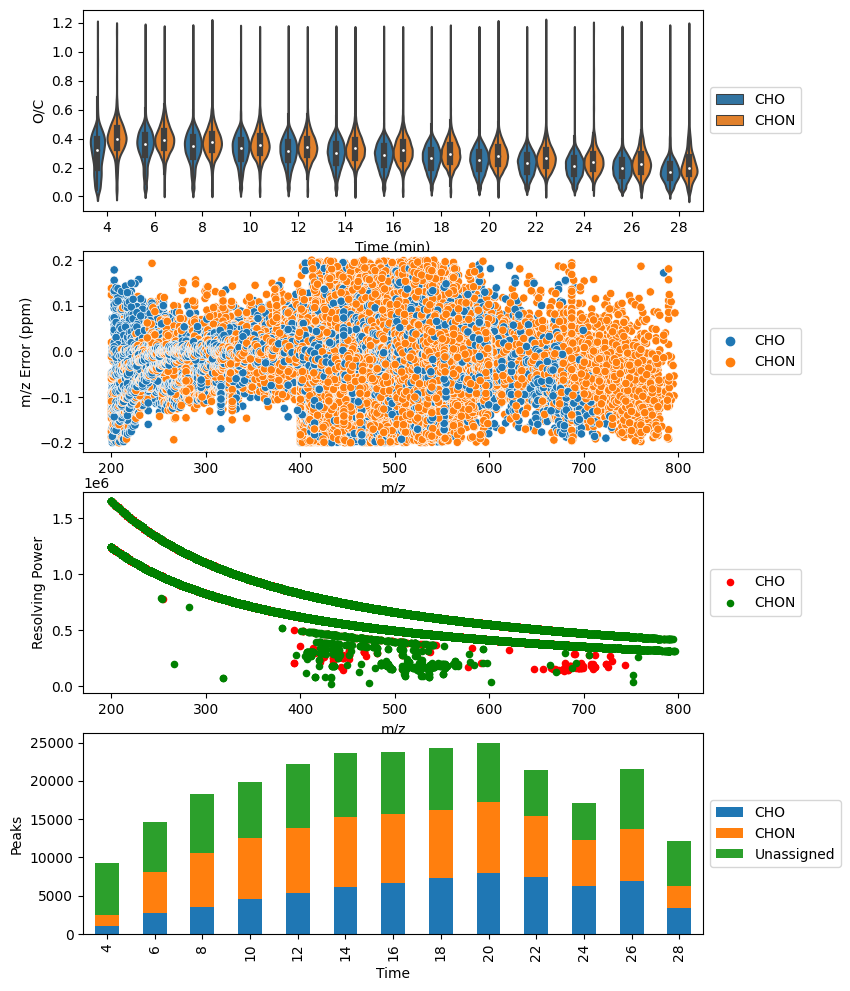

In [14]:
data.assess_all_results() ## why is it necessary to run this to get self.complete_results_df?

In [15]:
# add 'm/z window' and 'rep' columns

data_df = data.complete_results_df

data_df = add_mzwindow_col(data_df)

data_df = addRepCol(data_df)

print(data_df['m/z window'].unique())
print(data_df['Rep'].unique())
print(data_df['file'].unique())

20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
[2 1]
['200-1200 m/z' '400-500 m/z' '400-600 m/z' '500-600 m/z']
[2 1]
['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_

In [16]:
# save assignment results as pd dataframe and export as .csv 
data_df.to_csv("/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/spring-max600mz_22-11-16_Cu.csv")


In [17]:
#create subsets of assignments based m/z window

list100mz = []
list200mz = []
listfullzmz = [] 

for mzwindow in data_df['m/z window'].unique():

    r_df = data_df[data_df['m/z window'] == mzwindow]

    if (mzwindow == '400-600 m/z') or (mzwindow == '600-800 m/z'):
        list200mz.append(r_df)

    elif (mzwindow == '400-500 m/z') or (mzwindow == '500-600 m/z') or (mzwindow == '600-700 m/z') or (mzwindow == '700-800 m/z'):
        list100mz.append(r_df) 

    elif (mzwindow == '200-1200 m/z'):
        listfullzmz.append(r_df) 

mz100 = pd.concat(list100mz)
mz200 = pd.concat(list200mz)
mzfull = pd.concat(listfullzmz)


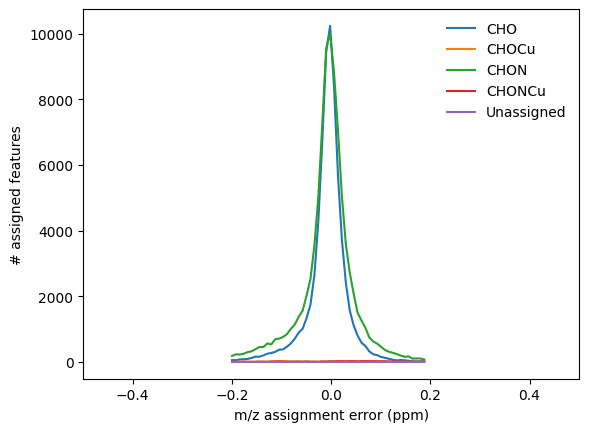

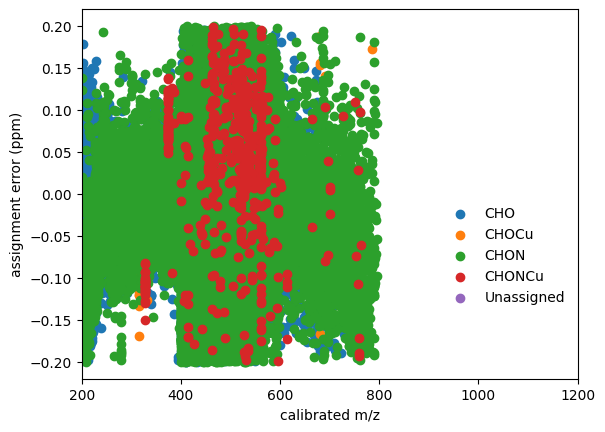

In [21]:
# plot assignment error distribution for full data set
pltMZerror(assignMolClass(data_df))

plt.show()

pltMZerror_pts(assignMolClass(data_df))

plt.show()

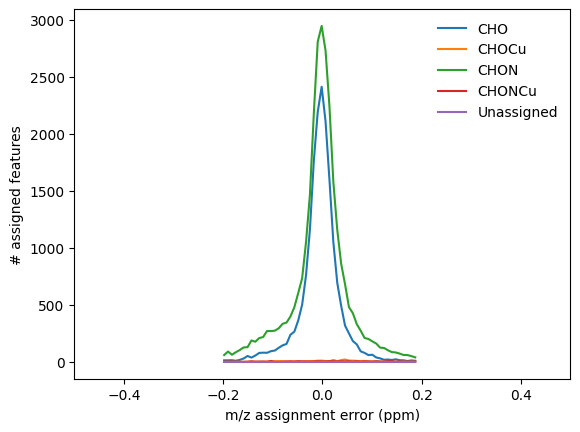

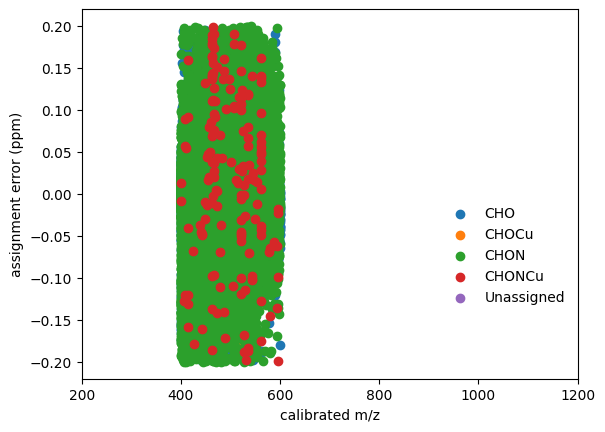

In [22]:
# plot assignment error dist for m/z 100 scans
pltMZerror(assignMolClass(mz100))

plt.show()

pltMZerror_pts(assignMolClass(mz100))

plt.show()

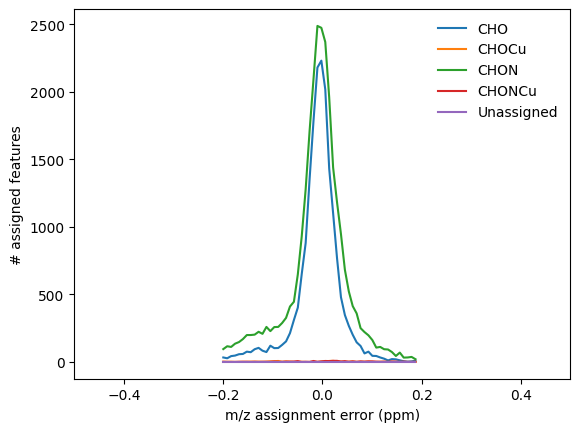

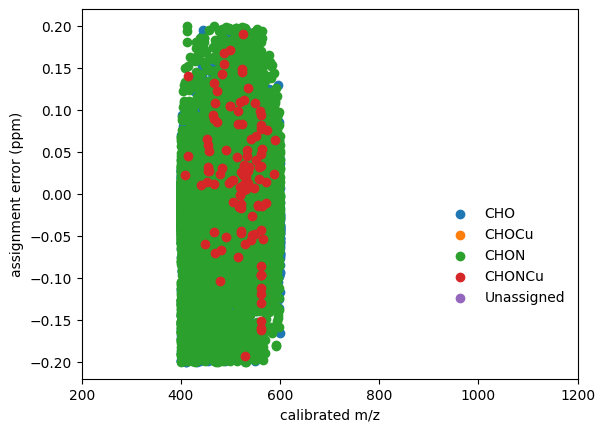

In [23]:
# plot assignment error dist for m/z 200 scans
pltMZerror(assignMolClass(mz200))

plt.show()

pltMZerror_pts(assignMolClass(mz200))

plt.show()

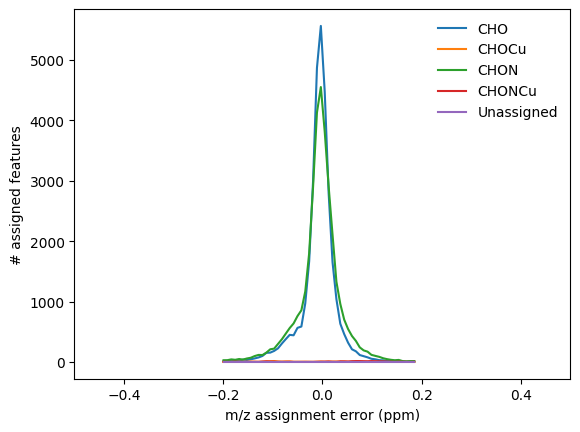

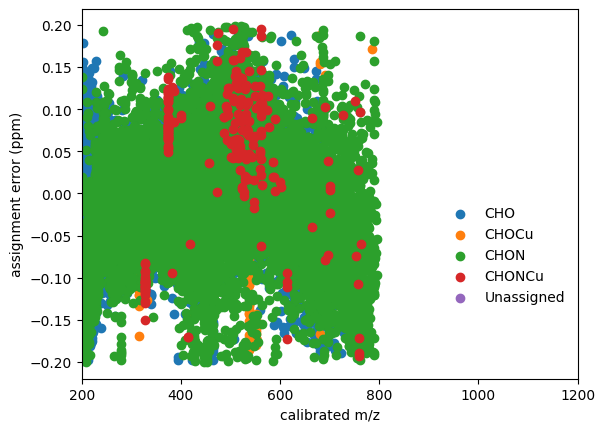

In [24]:
# plot assignment error dist for full m/z scans 
pltMZerror(assignMolClass(mzfull))

plt.show()

pltMZerror_pts(assignMolClass(mzfull))

plt.show()

In [25]:
assigned_100mz = mz100[~mz100['Molecular Formula'].isnull()]
assigned_200mz = mz200[~mz200['Molecular Formula'].isnull()]
assigned_fullmz = mzfull[~mzfull['Molecular Formula'].isnull()]

print('400-600 m/z, 100 m/z windowing: \n%s features total; %s assigned (%.1f%%)' %(np.shape(mz100)[0],  np.shape(assigned_100mz)[0], np.shape(assigned_100mz)[0] / np.shape(mz100)[0] * 100))
print('400-600 m/z, 200 m/z windowing: \n%s features total; %s assigned (%.1f%%)' %(np.shape(mz200)[0], np.shape(assigned_200mz)[0], np.shape(assigned_200mz)[0] / np.shape(mz200)[0] * 100))
print('200-800 m/z window (full scan): \n%s features total; %s assigned (%.1f%%)' %(np.shape(mzfull)[0],np.shape(assigned_fullmz)[0],  np.shape(assigned_fullmz)[0] / np.shape(mzfull)[0] * 100))

print('\n\n')

unique_100mz = getUniqueFeatures(assigned_100mz)
unique_200mz = getUniqueFeatures(assigned_200mz)
unique_fullmz = getUniqueFeatures(assigned_fullmz)


400-600 m/z, 100 m/z windowing: 
96044 features total; 52963 assigned (55.1%)
400-600 m/z, 200 m/z windowing: 
81961 features total; 51116 assigned (62.4%)
200-800 m/z window (full scan): 
120536 features total; 76306 assigned (63.3%)



total # results: 52963
# unique results: 31392
total # results: 51116
# unique results: 27324
total # results: 76306
# unique results: 38502


In [26]:
assigned_100mz_456 = assigned_100mz[(assigned_100mz['m/z']>=400)]
assigned_100mz_456 = assigned_100mz_456[(assigned_100mz_456['m/z']<=600)]

assigned_200mz_456 = assigned_200mz[(assigned_200mz['m/z']>=400)]
assigned_200mz_456 = assigned_200mz_456[(assigned_200mz_456['m/z']<=600)]

assigned_fullmz_456 = assigned_fullmz[(assigned_fullmz['m/z']>=400)]
assigned_fullmz_456 = assigned_fullmz_456[(assigned_fullmz_456['m/z']<=600)]

mz100_456 = mz100[(mz100['m/z']>=400)]
mz100_456 = mz100_456[(mz100_456['m/z']<=600)]

mz200_456 = mz200[(mz200['m/z']>=400)]
mz200_456 = mz200_456[(mz200_456['m/z']<=600)]

mzfull_456 = mzfull[(mzfull['m/z']>=400)]
mzfull_456 = mzfull_456[(mzfull_456['m/z']<=600)]

print('400-600 m/z, 100 m/z windowing: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mz100_456)[0],  np.shape(assigned_100mz_456)[0], np.shape(assigned_100mz_456)[0] / np.shape(mz100_456)[0] * 100))
print('\n400-600 m/z, 200 m/z windowing: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mz200_456)[0], np.shape(assigned_200mz_456)[0], np.shape(assigned_200mz_456)[0] / np.shape(mz200_456)[0] * 100))
print('\n400-600 m/z, full window: \n%s features total\n%s assigned (%.1f%%)' %(np.shape(mzfull_456)[0],np.shape(assigned_fullmz_456)[0],  np.shape(assigned_fullmz_456)[0] / np.shape(mzfull_456)[0] * 100))



400-600 m/z, 100 m/z windowing: 
96044 features total
52963 assigned (55.1%)

400-600 m/z, 200 m/z windowing: 
81961 features total
51116 assigned (62.4%)

400-600 m/z, full window: 
55654 features total
33834 assigned (60.8%)


In [27]:

unique_100mz_456 = getUniqueFeatures(assigned_100mz_456)
unique_200mz_456 = getUniqueFeatures(assigned_200mz_456)
unique_fullmz_456 = getUniqueFeatures(assigned_fullmz_456)

total # results: 52963
# unique results: 31392
total # results: 51116
# unique results: 27324
total # results: 33834
# unique results: 17644


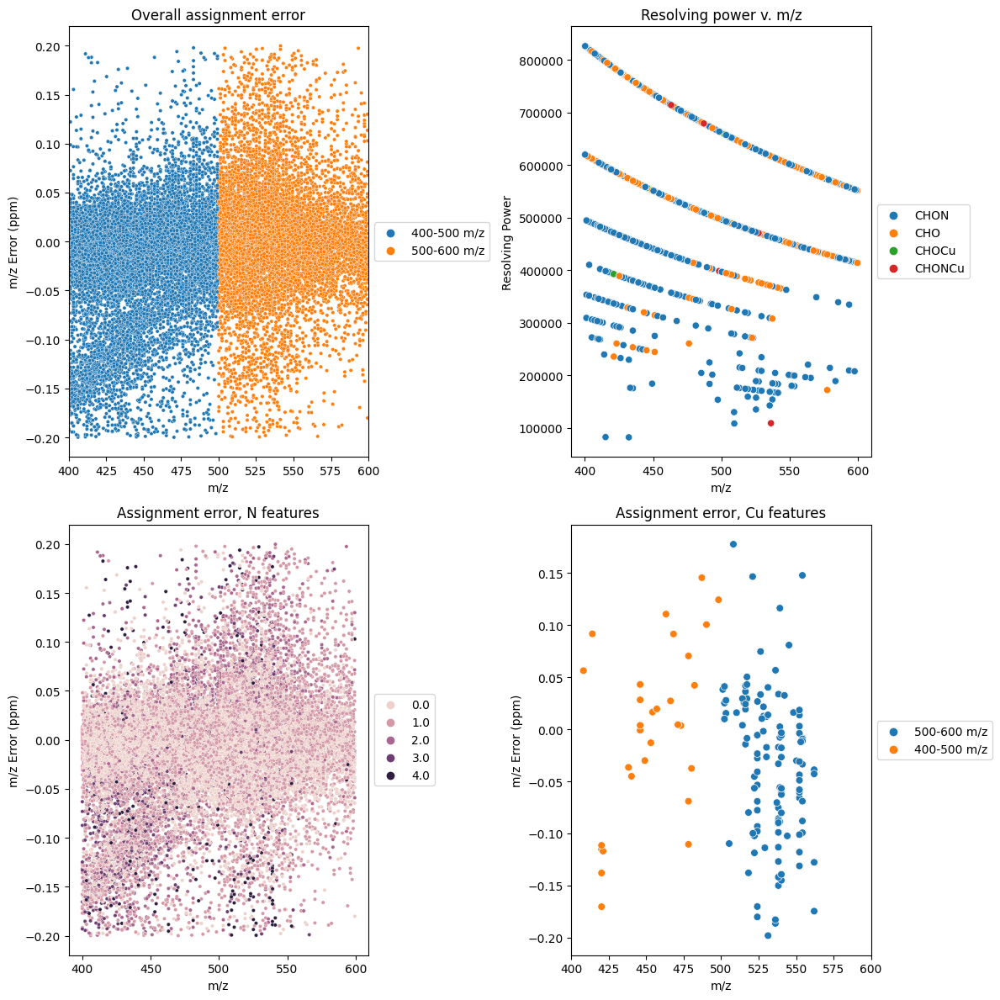

['20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw']


In [82]:
# 100 m/z window, error plots with blanks removed 
mask = ~unique_100mz_456['file'].str.contains('qh2o', case=False, na=False)
unique_100mz_nb=unique_100mz_456[mask]
df = assignMolClass(unique_100mz_nb)

fig = plotUnique(df,ps=10)
plt.tight_layout()
plt.show()
print(unique_100mz_nb['file'].unique())

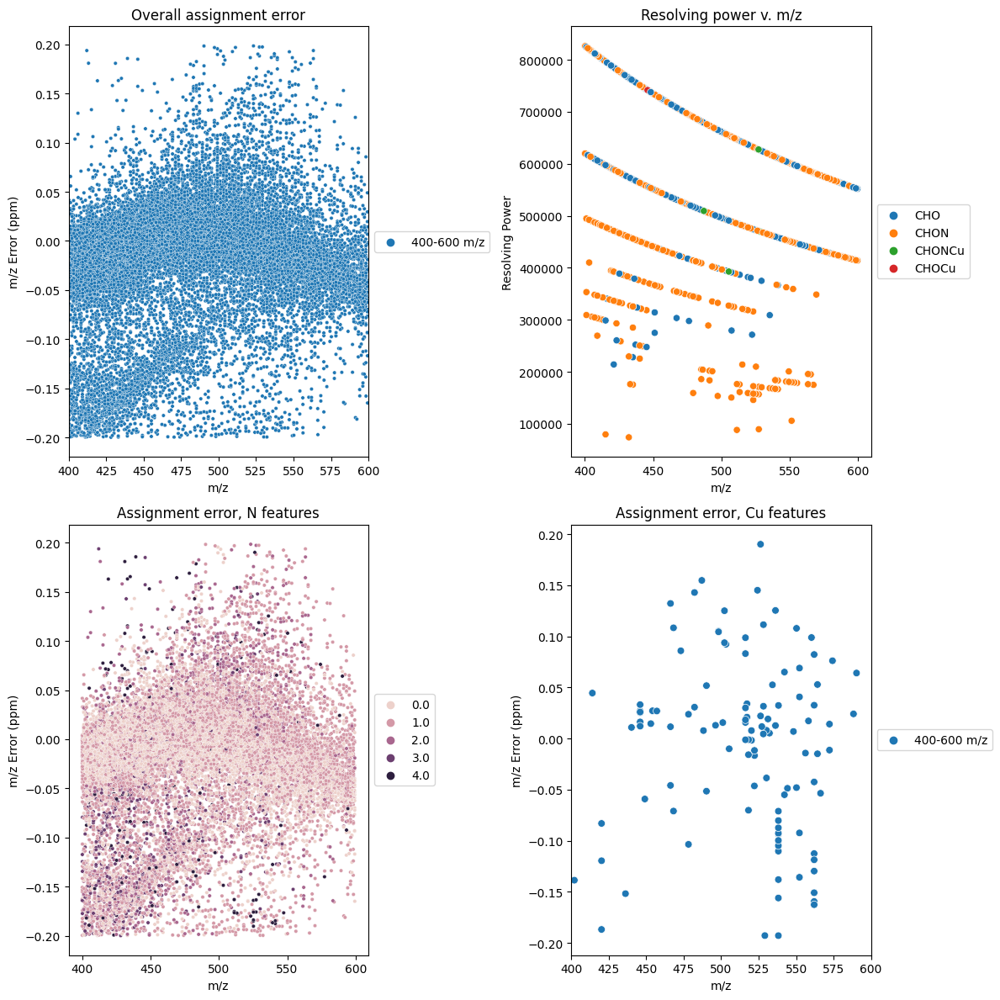

['20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw']


In [83]:
# 200 m/z window, error plots with blanks removed 

mask = ~unique_200mz_456['file'].str.contains('qh2o', case=False, na=False)
unique_200mz_nb=unique_200mz_456[mask]


fig = plotUnique(assignMolClass(unique_200mz_nb),ps=10)
plt.tight_layout()
plt.show()
plt.close('all')

print(unique_200mz_nb['file'].unique())

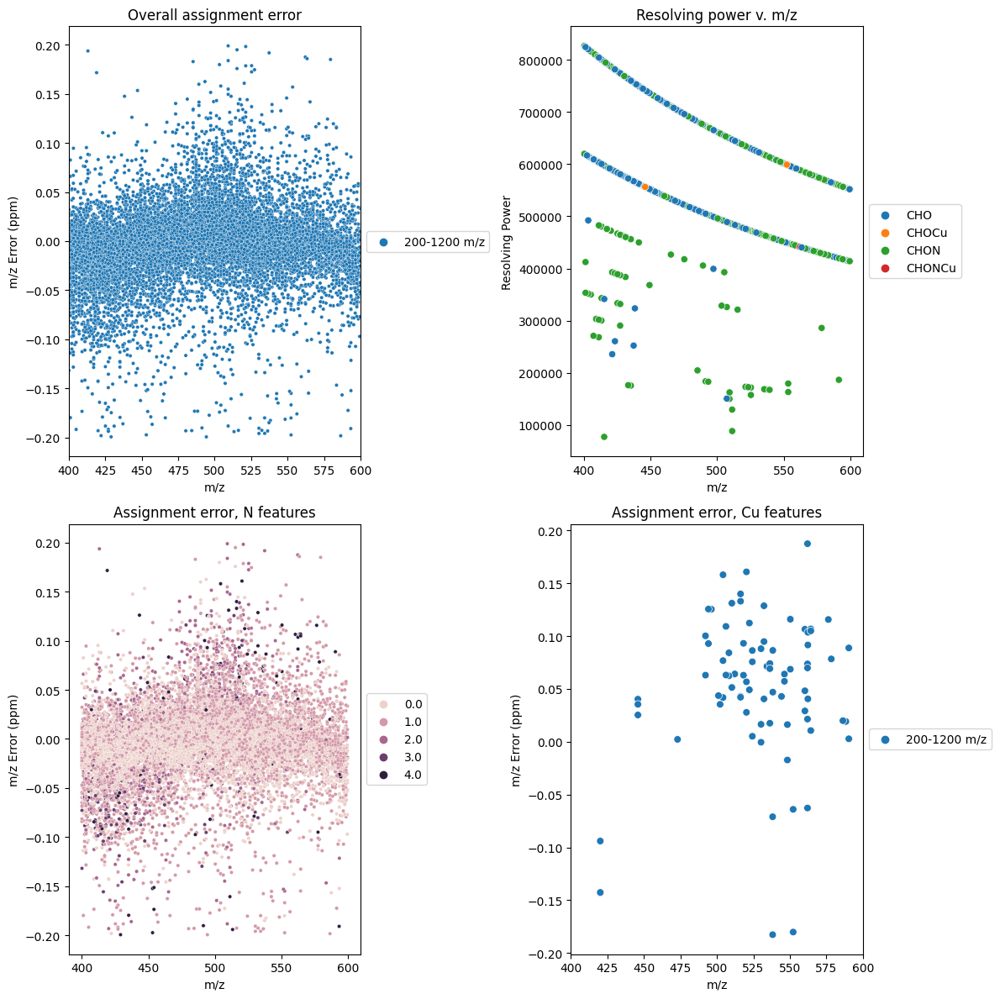

['20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw']


In [84]:
# full m/z window, error plots with blanks removed 

mask = ~unique_fullmz_456['file'].str.contains('qh2o', case=False, na=False)
unique_fullmz_nb=unique_fullmz_456[mask]


fig = plotUnique(assignMolClass(unique_fullmz_nb),ps=10)
plt.tight_layout()
plt.show()
plt.close('all')

print(unique_fullmz_nb['file'].unique())

In [31]:
# create 200 m/z blank files from 100 m/z blank files (did not collect 200 m/z blank files)

blank_files = [f for f in data._raw_filelist if 'qh2o' in f]

blank_data = []

for f in blank_files:

    if 'fullmz' not in f:
        
        temp = data_df[data_df['file'] == f] 

        blank_data.append(temp)

blanks_df = pd.concat(blank_data)

rep1_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
rep1_temp = rep1_temp[rep1_temp['m/z'] <= 600]
rep1_temp['file'] = 'mz200_400_600_blnk'
rep1_temp['m/z window'] = '400-600 m/z'

blanks_df = pd.concat([blanks_df,rep1_temp])

#rep1_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
#rep1_temp = rep1_temp[rep1_temp['m/z'] >= 600]
#rep1_temp['file'] = 'mz200_600_800_blnk'
#rep1_temp['m/z window'] = '600-800 m/z'

blanks_df = pd.concat([blanks_df,rep1_temp])


rep2_temp = blanks_df[blanks_df['file'].str.contains('rep2')]
rep2_temp = rep2_temp[rep2_temp['m/z'] <= 600]
rep2_temp['file'] = 'mz200_400_600_blnk_rep2'
rep2_temp['m/z window'] = '400-600 m/z'

blanks_df = pd.concat([blanks_df,rep2_temp])

#rep2_temp = blanks_df[~blanks_df['file'].str.contains('rep2')]
#rep2_temp = rep2_temp[rep2_temp['m/z'] >= 600]
#rep2_temp['file'] = 'mz200_600_800_blnk_rep2'
#rep2_temp['m/z window'] = '600-800 m/z'

blanks_df = pd.concat([blanks_df,rep2_temp])

print(blanks_df['file'].unique())

print(blanks_df['m/z window'].unique())



['20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw' 'mz200_400_600_blnk'
 'mz200_400_600_blnk_rep2']
['500-600 m/z' '400-500 m/z' '400-600 m/z']


In [32]:
# add 200 m/z blank data to master df

mz200_blanks = blanks_df[blanks_df['m/z window'] == '400-600 m/z']
data_df = pd.concat([data_df, mz200_blanks])

for f in data_df['file'].unique():
    print(f)




20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_400_600_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw
20221103_LBA_Boiteau_Zorbax3p5_spring_500_600_rep2.raw
mz200_400_600_blnk
mz200_400_600_blnk_rep2


In [33]:
# add fullmz blanks to blanks df
blanks_df = pd.concat([blanks_df, data_df[data_df['file'] =='20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw' ]])
blanks_df = pd.concat([blanks_df, data_df[data_df['file'] =='20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw' ]])

print(blanks_df['m/z window'].unique())

['500-600 m/z' '400-500 m/z' '400-600 m/z' '200-1200 m/z']


In [34]:
# add column with blank file identity to use in blank subtraction
df_backup = data_df
df_backup.to_csv("/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/spring-max600mz_backup.csv")

data_df['blank file'] = data_df.index

for window in data_df['m/z window'].unique():

    temp1 = data_df[data_df['m/z window'] == window] # all features collected in given m/z window       
    btemp1 = blanks_df[blanks_df['m/z window'] == window] # all blank feautres collected in same m/z window

    for r in temp1['Rep'].unique():
        temp2 = temp1[temp1['Rep'] == r]
        btemp2 = btemp1[btemp1['Rep'] == r]


        temp2['blank file'] = btemp2['file'].iloc[0]

        data_df[(data_df['m/z window'] == window) & (data_df['Rep'] == r)]  = temp2


print(data_df['blank file'].unique())

['20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500_rep2.raw'
 'mz200_400_600_blnk'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600_rep2.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_fullmz.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_400_500.raw'
 '20221103_LBA_Boiteau_Zorbax3p5_qh2o_500_600.raw'
 'mz200_400_600_blnk_rep2']


In [35]:
def blankSubtract(df, blnkthresh = 0.9):
    
    holder = []
    for file in df['file'].unique():
        
        #if file == 
        sub = df[df['file'] == file]

        blkf = sub['blank file'].iloc[0]


        sub[sub[file]== np.nan] = 0

        nom = sub[file]
        den = sub[blkf]

        nom = nom.replace(np.nan,0)
        den = den.replace(np.nan,1)

        if file != blkf:
            nom = nom
        elif file == blkf:
            nom = nom * (blnkthresh*0.8)

        sub['blank subtract'] = nom/den
        holder.append(sub)
    df_end = pd.concat(holder)
    df_end = df_end[df_end['blank subtract'] > blnkthresh]
    return df_end

In [36]:
df_unique = getUniqueFeatures(data_df)


total # results: 337307
# unique results: 53755


In [37]:


df_bs = blankSubtract(df_unique, blnkthresh=0.3)


(43844, 53)


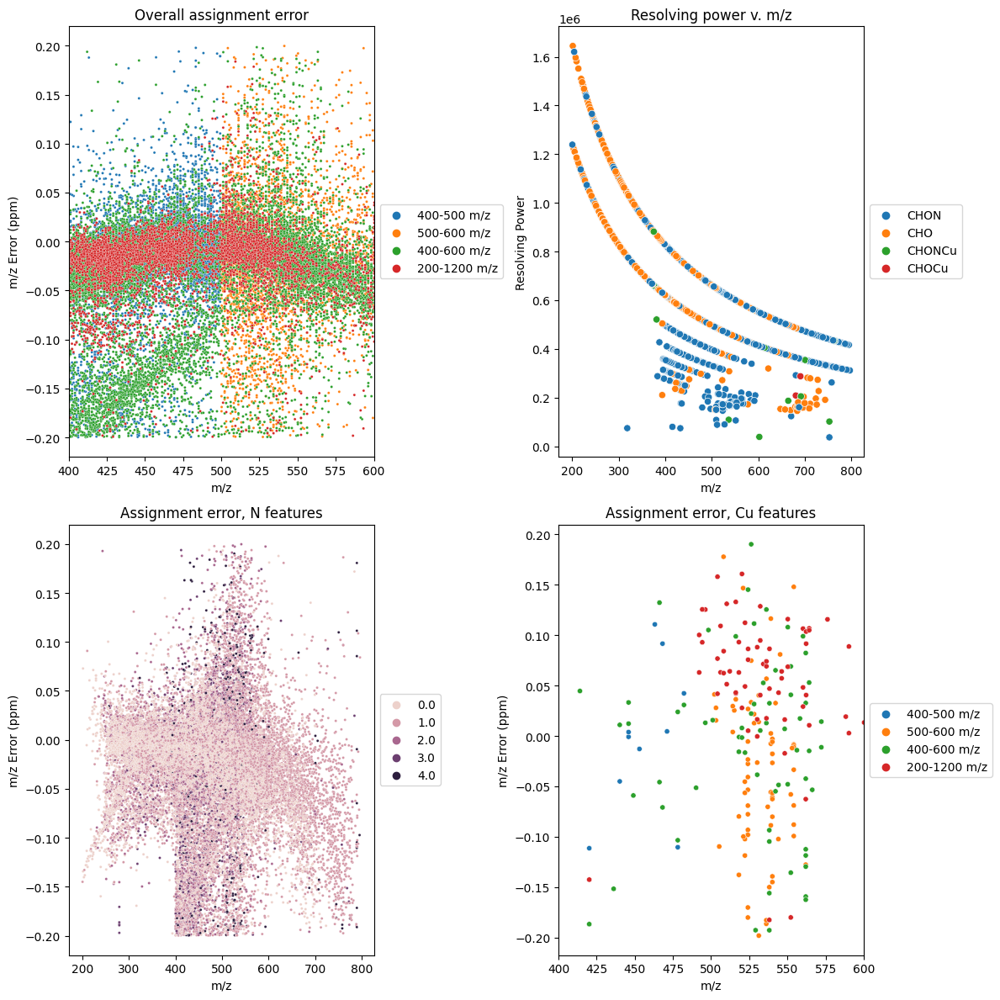

In [85]:
temp = df_bs
print(np.shape(temp))
fig = plotUnique(assignMolClass(pd.concat([temp[temp['m/z window']== '400-500 m/z'], temp[temp['m/z window']=='500-600 m/z'], temp[temp['m/z window']=='400-600 m/z'], temp[temp['m/z window']=='200-1200 m/z']])),ps=5)

plt.tight_layout()
plt.show()
plt.close('all')

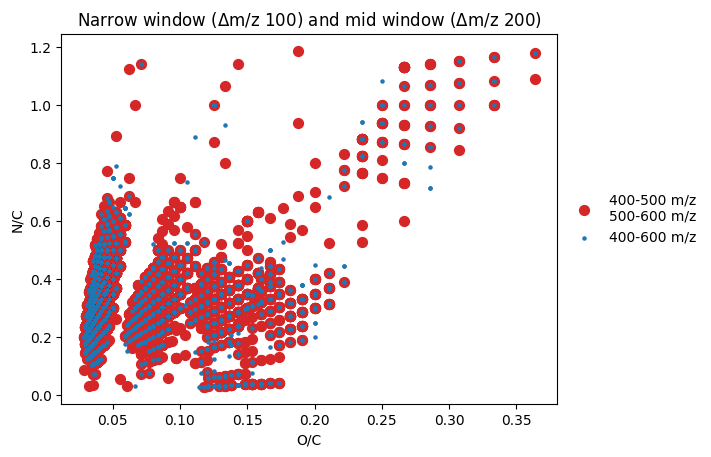

In [97]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs
df2 = mz200_bs
df3 = mzfull_bs
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
#sns.scatterplot(x='N/C',y='O/C', hue='m/z', data=df, ax=ax,s=50)
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='C0',s=5,label='400-600 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and mid window ($\Delta$m/z 200)')
plt.show()


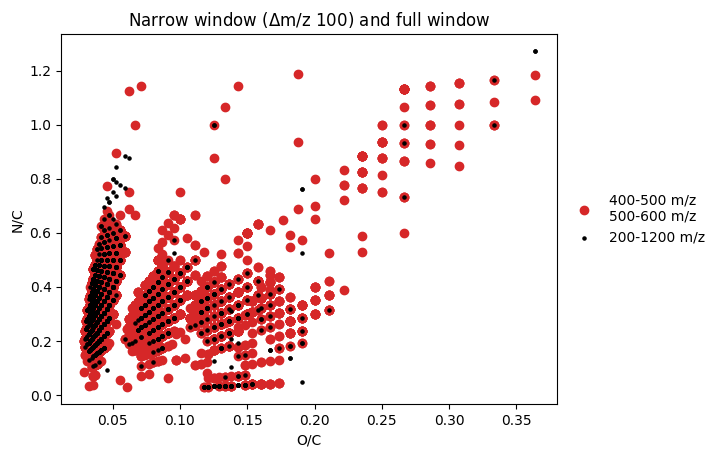

In [98]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs
df2 = mz200_bs
df3 = mzfull_bs
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
#ax.scatter(x=df2['N/C'],y=df2['O/C'],c='black',s=5,label='400-600 m/z') #s=df2['S/N'],
ax.scatter(x=df3['N/C'],y=df3['O/C'],c='black',s=5,label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and full window')
plt.show()


In [99]:
mz100_contains_cu = mz100_bs[mz100_bs['Cu'] == 1]
print(np.shape(mz100_contains_cu))
mz200_contains_cu = mz200_bs[mz200_bs['Cu'] == 1]
print(np.shape(mz200_contains_cu))
mzfull_contains_cu = mzfull_bs[mzfull_bs['Cu'] == 1]
print(np.shape(mzfull_contains_cu))

(159, 53)
(160, 53)
(102, 53)


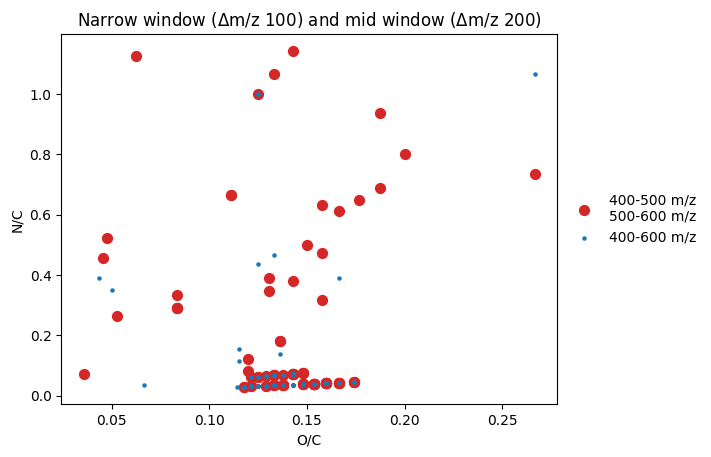

In [100]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs[mz100_bs['Cu'] == 1]
df2 = mz200_bs[mz200_bs['Cu'] == 1]
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='C0',s=5,label='400-600 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and mid window ($\Delta$m/z 200)')
plt.show()


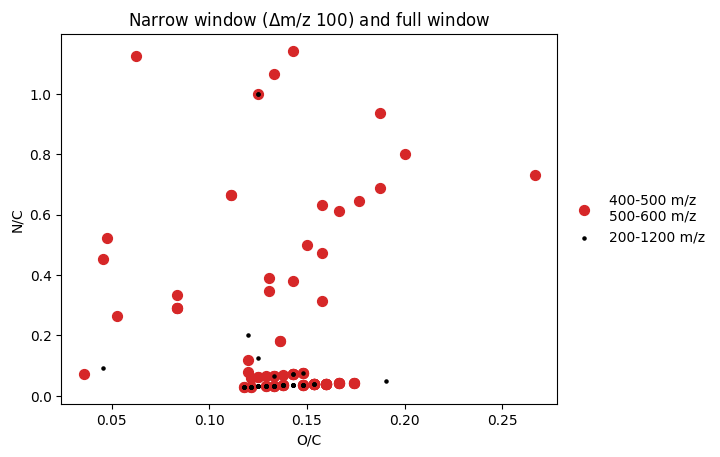

In [101]:
mz100_bs = df_bs[(df_bs['m/z window'] == '400-500 m/z') | (df_bs['m/z window'] == '500-600 m/z')]

mz200_bs = df_bs[(df_bs['m/z window'] == '400-600 m/z')]

mzfull_bs = df_bs[(df_bs['m/z window'] == '200-1200 m/z')]
mzfull_bs = mzfull_bs[(mzfull_bs['m/z']>=400) & (mzfull_bs['m/z']<= 600)]

df = mz100_bs[mz100_bs['Cu'] == 1]
df2 = mzfull_bs[mzfull_bs['Cu'] == 1]
fig, ax = plt.subplots()
ax.scatter(x=df['N/C'],y=df['O/C'],c='C3',s=50,label='400-500 m/z\n500-600 m/z')#,s=df['S/N']
ax.scatter(x=df2['N/C'],y=df2['O/C'],c='black',s=5,label='200-1200 m/z') #s=df2['S/N'],
#ax.scatter(x=df3['N/C'],y=df3['O/C'],c='C5',label='200-1200 m/z') #s=df3['S/N']
ax.set(xlabel='O/C',ylabel='N/C')
#ax.set_xlim(0,1.2)
#ax.set_ylim(0,0.5)
ax.legend(frameon=False, bbox_to_anchor=(1.0,0.5), loc='center left')
plt.title(r'Narrow window ($\Delta$m/z 100) and full window')
plt.show()

In [137]:
#data.master_data_holder['20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'] #[file]={'parser': parser}

mz100_EICdic = {}
for mz,file,mf in zip(mz100_contains_cu['m/z'],mz100_contains_cu['file'],mz100_contains_cu['Molecular Formula']):
    
    parser = data.master_data_holder[file]['parser']    
 
    EIC=parser.get_eics(target_mzs=[mz],tic_data={},peak_detection=False,smooth=False)
    mz100_EICdic[mf]=EIC[0][mz]
    #mz100_EICdic[mz]={'eic':EIC[0][mz],'formula':mf}



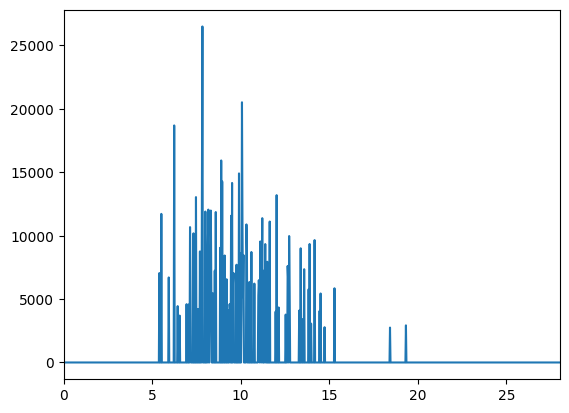

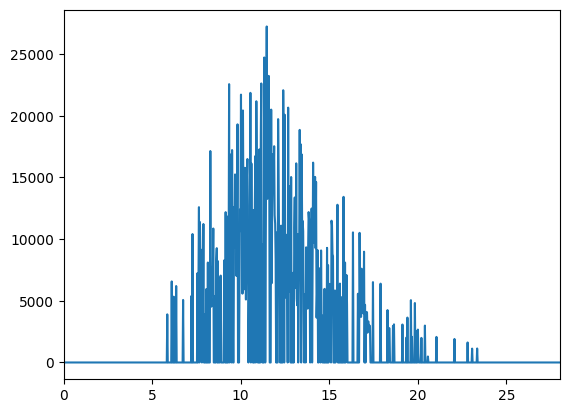

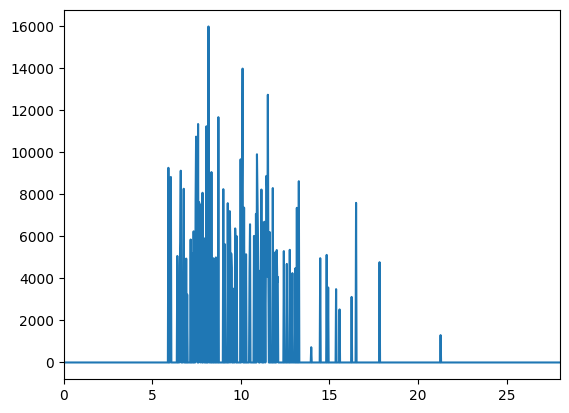

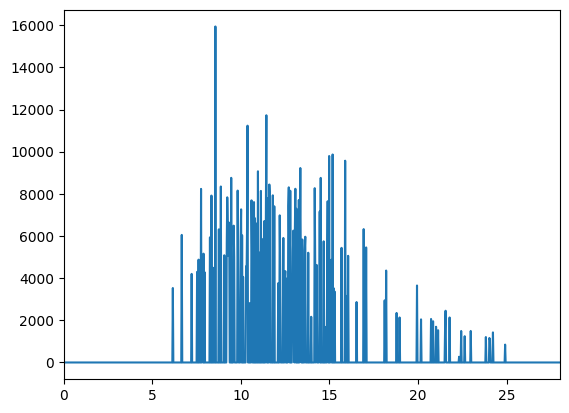

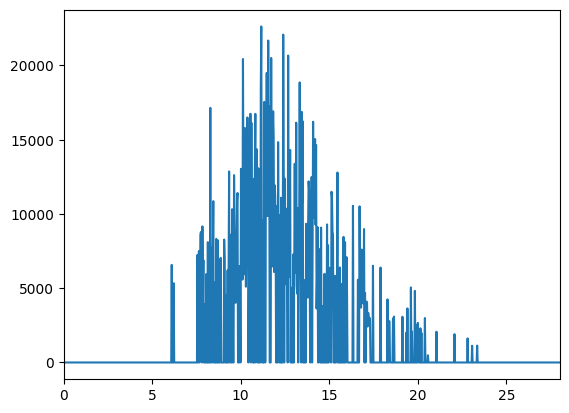

...

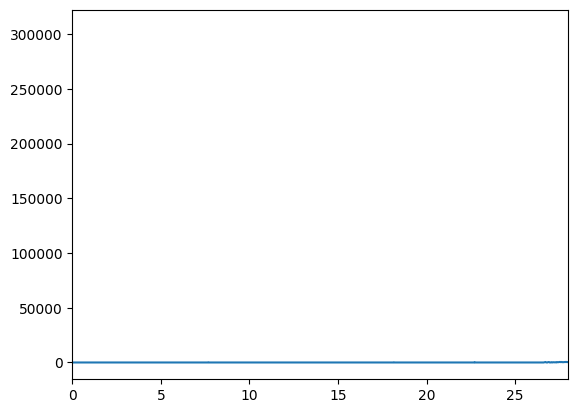

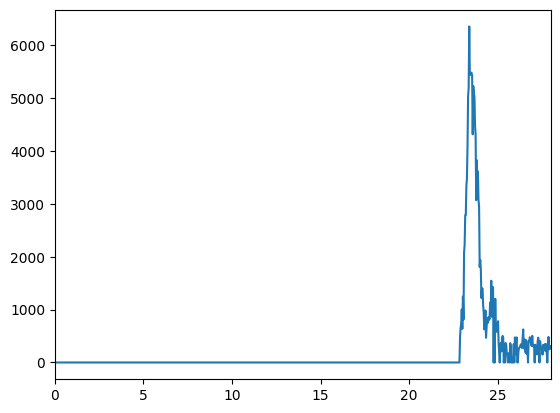

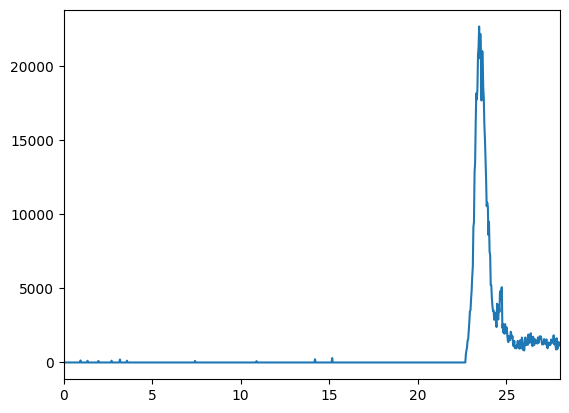

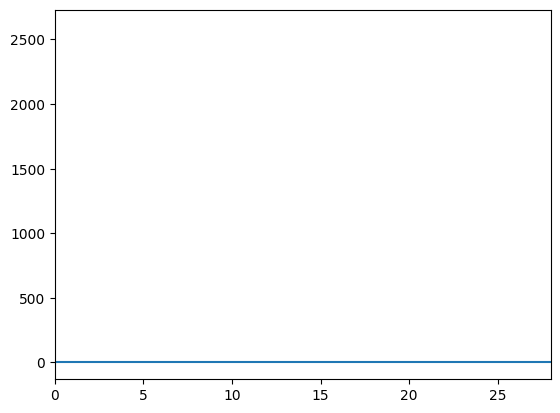

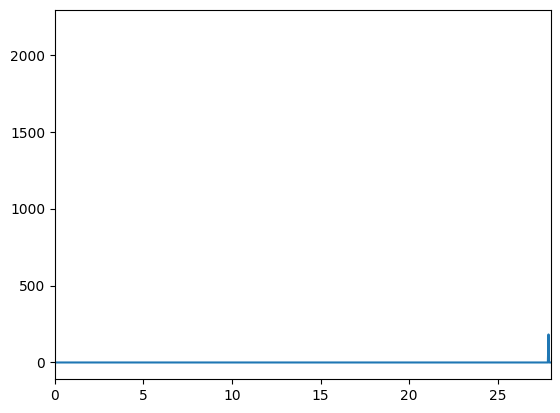

In [123]:
for mz in mz100_EICdic:   
    eict=mz100_EICdic[mz].time
    eics=mz100_EICdic[mz].eic
    if max(eics) > 1000:
        fig, ax = plt.subplots()

        ax.plot(eict, eics)

        ax.set_xlim(0,28)

        plt.show()

In [138]:
#data.master_data_holder['20221103_LBA_Boiteau_Zorbax3p5_spring_400_500_rep2.raw'] #[file]={'parser': parser}

fullmz_EICdic = {}
for mz,file,mf in zip(mzfull_contains_cu['m/z'],mzfull_contains_cu['file'],mzfull_contains_cu['Molecular Formula']):
    
    parser = data.master_data_holder[file]['parser']
 
    EIC=parser.get_eics(target_mzs=[mz],tic_data={},peak_detection=False,smooth=False)
    fullmz_EICdic[mf]=EIC[0][mz]


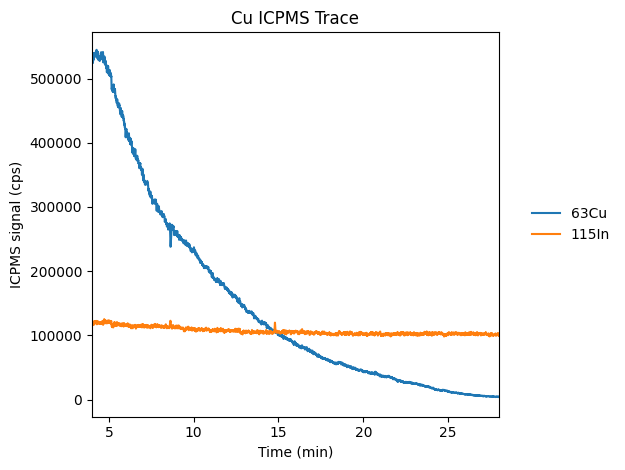

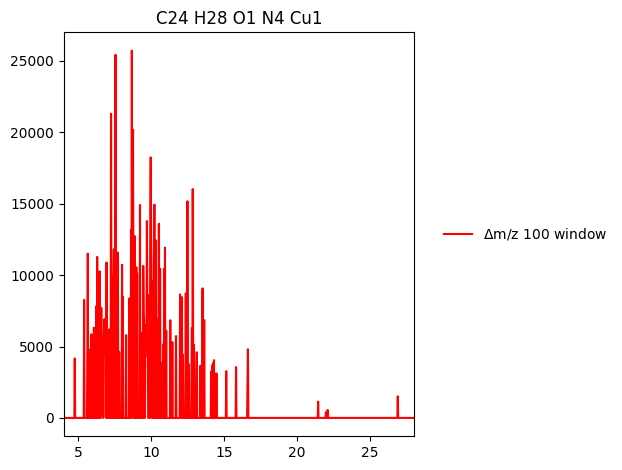

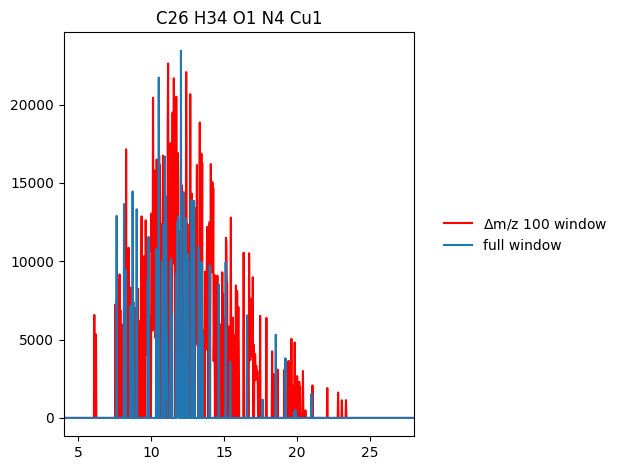

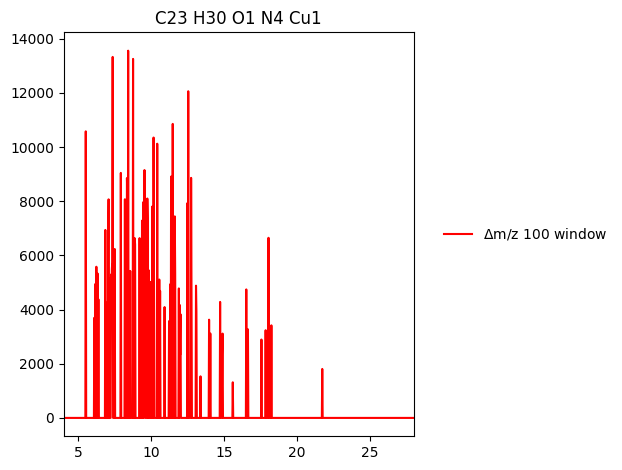

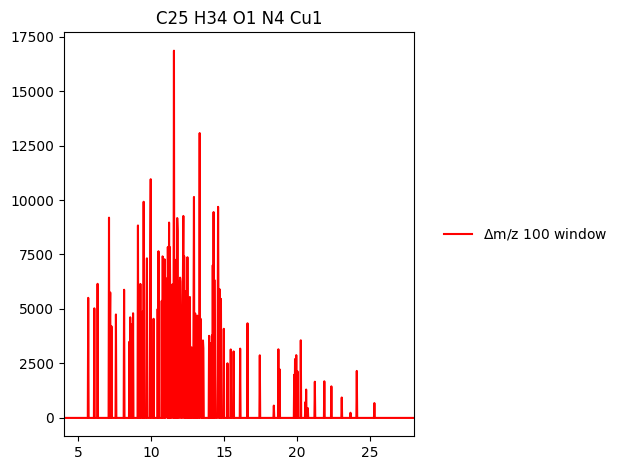

...

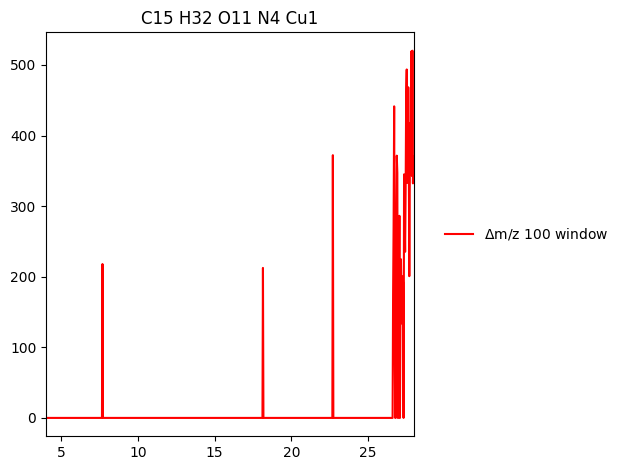

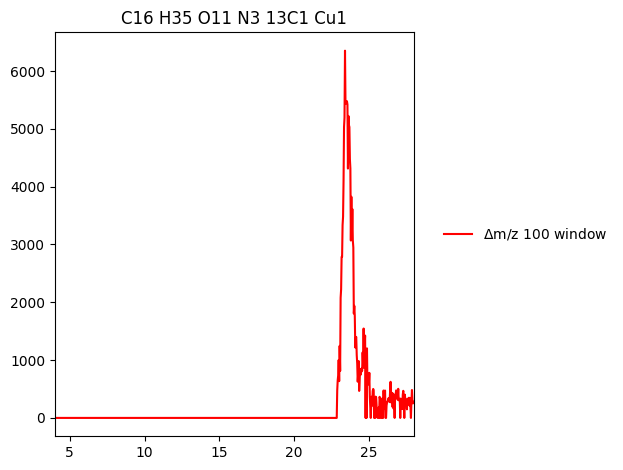

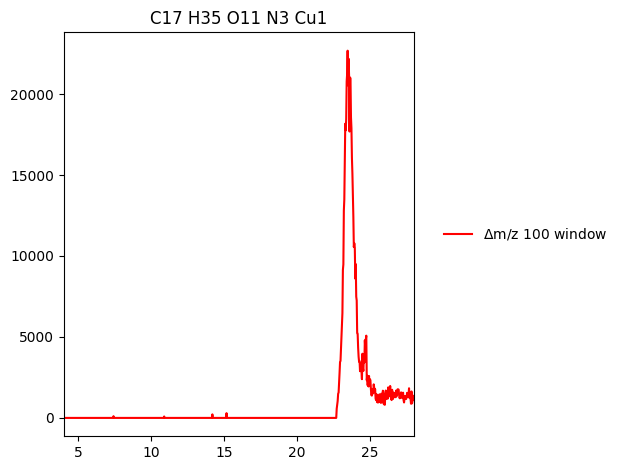

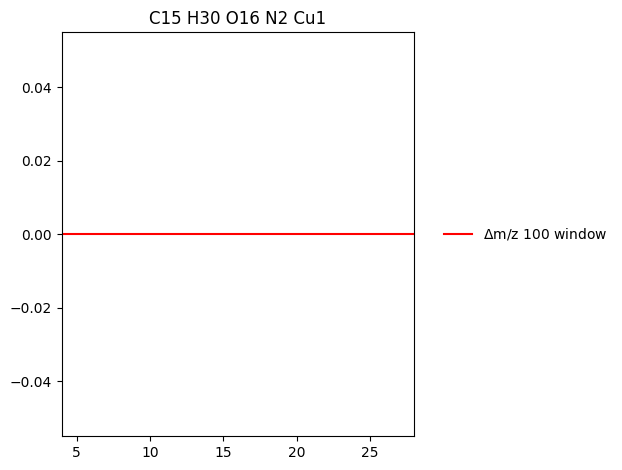

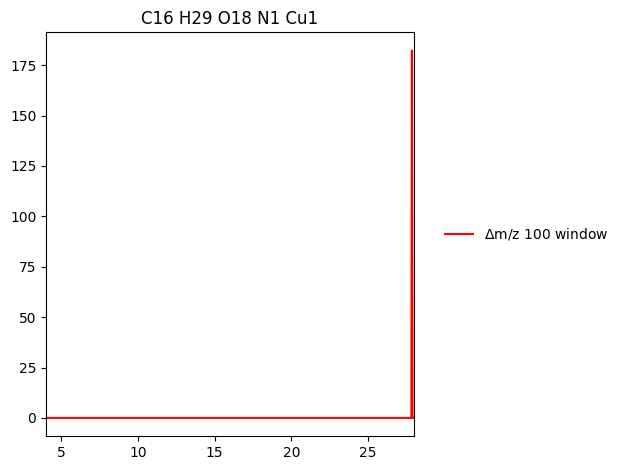

In [159]:
from matplotlib.backends.backend_pdf import PdfPages

icpms_file = '/Users/christiandewey/Library/CloudStorage/Box-Box/Boiteau Lab/Mass Spec Data/Keck iCAP Q/2022/2022-09/Tillamook, Sept 2022/spring_ENV.csv'
icpms = pd.read_csv(icpms_file, sep=';',header=1)


metals = ['63Cu', '115In']

pdf = PdfPages('/Users/christiandewey/Library/CloudStorage/Box-Box/data/assignments/spring/eics_cu_100mz_fullmz.pdf')

fig, ax = plt.subplots()

maxicp = 0 
for me in metals:
    me_key = 'Time %s' %me
    ax.plot(icpms[me_key]/60, icpms[me], label=me)        
    



#ax.set_ylim(0,maxicp*1.1)
ax.set_title('Cu ICPMS Trace')
ax.set_xlabel('Time (min)')
ax.set_ylabel('ICPMS signal (cps)')
ax.legend(bbox_to_anchor=(1.05,0.5),loc='center left',frameon =False)
ax.set_xlim(4,28)
fig.tight_layout()
pdf.savefig()

for mf in mz100_EICdic:   

    fig, ax = plt.subplots()
    
    eict=mz100_EICdic[mf].time
    eics=mz100_EICdic[mf].eic

    inds = np.where(np.asarray(eict)<28)

    eict = np.asarray(eict)[inds]
    eics = np.asarray(eics)[inds]

    ax.plot(eict, eics,color = 'red', label=r'$\Delta$m/z 100 window')

    if mf in fullmz_EICdic:
        eic2t = fullmz_EICdic[mf].time
        eic2s = fullmz_EICdic[mf].eic

        eic2t = np.asarray(eic2t)[inds]
        eic2s = np.asarray(eic2s)[inds]
        ax.plot(eic2t,eic2s, color ='C0', label = 'full window')
    ax.set_xlim(4,28)
    ax.set_title(mf)
    ax.legend(frameon = False,bbox_to_anchor=(1.05,0.5),loc='center left')
    fig.tight_layout()
    pdf.savefig()

pdf.close()

In [150]:
inds = np.where(np.asarray(mz100_EICdic[mf].time)<28)

np.asarray(mz100_EICdic[mf].time)[inds]

array([5.17500000e-03, 1.57000000e-02, 5.18683333e-02, 8.80150000e-02,
       1.24130000e-01, 1.60268333e-01, 1.96418333e-01, 2.32550000e-01,
       2.68705000e-01, 3.04830000e-01, 3.40980000e-01, 3.77120000e-01,
       4.13255000e-01, 4.49393333e-01, 4.85538333e-01, 5.21685000e-01,
       5.57823333e-01, 5.93956667e-01, 6.30096667e-01, 6.66235000e-01,
       7.02375000e-01, 7.38525000e-01, 7.74665000e-01, 8.10800000e-01,
       8.46935000e-01, 8.83078333e-01, 9.19225000e-01, 9.55358333e-01,
       9.91496667e-01, 1.02764833e+00, 1.06377667e+00, 1.09992500e+00,
       1.13605667e+00, 1.17219667e+00, 1.20833833e+00, 1.24448667e+00,
       1.28063667e+00, 1.31676000e+00, 1.35290333e+00, 1.38904167e+00,
       1.42518667e+00, 1.46133167e+00, 1.49747000e+00, 1.53361833e+00,
       1.56974667e+00, 1.60503833e+00, 1.64118833e+00, 1.67733167e+00,
       1.71346167e+00, 1.74960333e+00, 1.78546833e+00, 1.82161833e+00,
       1.85759833e+00, 1.89238000e+00, 1.92852000e+00, 1.96389667e+00,
      

In [45]:

def getParser(file):
    parser = rawFileReader.ImportMassSpectraThermoMSFileReader(file)
    return parser

def assign_formula(parser, interval, timerange, refmasslist=None):
    #Function to build formula assignment lists
    #Retrieve TIC for MS1 scans over the time range between 'timestart' and 'timestop' 

    tic=parser.get_tic(ms_type='MS')[0]
    tic_df=pd.DataFrame({'time': tic.time,'scan': tic.scans})

    times=list(range(timerange[0],timerange[1],interval))

    results=[]
    
    for timestart in times:

        scans=tic_df[tic_df.time.between(timestart,timestart+interval)].scan.tolist()

        mass_spectrum = parser.get_average_mass_spectrum_by_scanlist(scans)    
        mass_spectrum.molecular_search_settings.ion_charge = 1

        #mass_spectrum.mass_spectrum.settings.calib_sn_threshold
        #mass_spectrum.mass_spectrum.settings.calib_pol_order
        #mass_spectrum.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)
        #MzDomainCalibration(mass_spectrum, ref_file_location).run()

        if refmasslist:
            mass_spectrum.settings.min_calib_ppm_error = 10
            mass_spectrum.settings.max_calib_ppm_error = -10
            calfn = MzDomainCalibration(mass_spectrum, refmasslist)
            ref_mass_list_fmt = calfn.load_ref_mass_list(refmasslist)

            imzmeas, mzrefs = calfn.find_calibration_points(mass_spectrum, ref_mass_list_fmt,
                                                        calib_ppm_error_threshold=(0, 2.0),
                                                        calib_snr_threshold=3)

            calfn.recalibrate_mass_spectrum(mass_spectrum, imzmeas, mzrefs, order=2)


        SearchMolecularFormulas(mass_spectrum, first_hit=False).run_worker_mass_spectrum()

        mass_spectrum.percentile_assigned(report_error=True)

        assignments=mass_spectrum.to_dataframe()

        assignments['Time']=timestart

        results.append(assignments)
    
    results=pd.concat(results,ignore_index=True)

    return(results)    

def plot_ms(df1, start_mz, end_mz, tstart, df2=None,df3=None, assignment= None, ax_ms=None, lbls=None, norm=False, labs=False, colors=None):   
    if ax_ms == None:
        f, ax = plt.subplots()
    
    else:
        ax = ax_ms

    if colors is not None:
        cols = colors
    else:
        cols = ['C0', 'C1', 'C2']
    mzrange= end_mz - start_mz
    ms_t_int=df1[df1['Time'] == tstart]
    ms_df = ms_t_int[((ms_t_int['Calibrated m/z']-start_mz)<mzrange) & ((ms_t_int['Calibrated m/z']-start_mz)>0)]

    maxdf1 = max(ms_df['S/N'])

    if norm:
        ms_df['S/N Norm'] = ms_df['S/N'] / maxdf1
    else:
        ms_df['S/N Norm'] = ms_df['S/N'] 

    

    print(ms_df['S/N Norm'])

    if lbls is not None:
        labels = lbls
    else:
        lbls = [None, None, None]

 
    _, stemlines1, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df,  markerfmt=' ', basefmt=' ', linefmt=cols[0], label = labels[0])
    
    if df2 is not None:
        ms_t_int2=df2[df2['Time'] == tstart]
        ms_df2 = ms_t_int2[(abs(ms_t_int2['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int2['Calibrated m/z']-start_mz)>0)]

        maxdf2 = max(ms_df2['S/N'])

        if norm:
            ms_df2['S/N Norm'] = ms_df2['S/N'] / maxdf2
        else:
            ms_df2['S/N Norm'] = ms_df2['S/N'] 
        
        _, stemlines2, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df2,  markerfmt=' ', basefmt=' ', linefmt=cols[1], label = labels[1])

    if df3 is not None:
        ms_t_int3=df3[df3['Time'] == tstart]
        ms_df3 = ms_t_int3[(abs(ms_t_int3['Calibrated m/z']-start_mz)<mzrange)& ((ms_t_int3['Calibrated m/z']-start_mz)>0)]

        maxdf3 = max(ms_df3['S/N'])

        if norm:
            ms_df3['S/N Norm'] = ms_df3['S/N'] / maxdf3
        else:
            ms_df3['S/N Norm'] = ms_df3['S/N'] 
        
        _, stemlines3, _ =ax.stem('Calibrated m/z','S/N Norm',data=ms_df3,  markerfmt=' ', basefmt=' ', linefmt=cols[2], label = labels[2])
    
    if df3 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2, maxdf3]) * 1.1)
    elif df2 is not None:
        ax.set_ylim(0, max([maxdf1, maxdf2]) * 1.1)
    else: 
        ax.set_ylim(0, maxdf1 * 1.1)

    ax.set_xlim(left = start_mz - mzrange*0.1, right = start_mz + mzrange + mzrange*0.1) 

    if labs:
        for mzr,peakr,mf,er in zip(ms_df['Calibrated m/z'], ms_df['S/N Norm'], ms_df['Molecular Formula'],  ms_df['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

            mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
            ax.text(mzr, peakr + 0.02 *max(ms_df['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color=cols[0])

        if df2 is not None:

            for mzr,peakr,mf, er in zip(ms_df2['Calibrated m/z'], ms_df2['S/N Norm'], ms_df2['Molecular Formula'], ms_df2['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df2['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[1])

        if df3 is not None:

            for mzr,peakr,mf, er in zip(ms_df3['Calibrated m/z'], ms_df3['S/N Norm'], ms_df3['Molecular Formula'], ms_df3['m/z Error (ppm)']):

            #if (mzr- target_mz)  == 0:
            #    mz_text = ' m/z\n%.4f' % (mzr)
            #else:
            #    mz_text = r'$\Delta$' + ' m/z\n%.4f' % (mzr- target_mz)

                mz_text = 'm/z %.4f\n%s\n%.3f ppm' % (mzr,mf,er)
                ax.text(mzr, peakr + 0.02 *max(ms_df3['S/N Norm']), mz_text, ha = 'center', fontsize = 'xx-small', weight = 'bold', color = cols[2])

   # theor_mz=pattern.mdiff+result['mass']
   # theor_int=pattern.ratio*result['abundance']
   # ax.stem(theor_mz,theor_int, basefmt=' ',linefmt='gray')

   # for isotope in pattern.isotope[pattern.requirement=='Y']:
   #     ax.stem('mz','intense',data=result[isotope],  markerfmt=' ', basefmt=' ',linefmt='red')
    if ax == None:

        ax.legend(('other', 'target'),bbox_to_anchor=(1.05, 1.0), loc='upper left',frameon=False)

        if(assignment):

            mf = assignment[0]
            score = assignment[1]
            er = assignment[2]

            ax.text(1.05,0.7,mf,transform=ax.transAxes)
            ax.text(1.05,0.6,'Error (ppm) = %.3f ' %er ,transform=ax.transAxes)
            ax.text(1.05,0.5,'Score = %.3f' %score ,transform=ax.transAxes)

    if norm: 
        ax.set(xlabel='Calibrated m/z',ylabel='Normalized S/N')
    else: 
        ax.set(xlabel='Calibrated m/z',ylabel='S/N')
    #ax.set_title('%.2f' %timerange[0] + ' to %.2f' %timerange[1] +' min', fontsize = 'medium')
    ax.legend(bbox_to_anchor = (1.00, 0.5), frameon =False, loc = 'center left')
    ax.axhline(y=0.0, color='black')
    plt.setp(stemlines1,'color', cols[0], 'linewidth', 2)
    if df2 is not None:
        plt.setp(stemlines2, 'color', cols[1],'linewidth', 2)
    if df3 is not None:
        plt.setp(stemlines3, 'color', cols[2],'linewidth', 2)
    plt.tight_layout()
    if ax_ms == None:
        return ax


def filterMzRange(results, mz_range):

    mz_i = mz_range[0]
    mz_f = mz_range[1]

    sub = results[(results['m/z'] >= mz_i) & (results['m/z'] <= mz_f)]

    return sub


def pltMZerror(results, bins=50):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        counts, bins = np.histogram(np.asarray(results[results['mol_class']==mol_class]['m/z Error (ppm)']),bins = bins)

        ax.plot(bins[:-1], counts, label = mol_class)

    ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False)
    ax.set_xlabel('m/z assignment error (ppm)')
    ax.set_ylabel('# assigned features')

    return ax

def pltMZerror_pts(results):
    ## assignment error distribution
    _, ax = plt.subplots()
    for mol_class in sorted(results['mol_class'].unique()):

        ax.scatter(results[results['mol_class']==mol_class]['Calibrated m/z'], results[results['mol_class']==mol_class]['m/z Error (ppm)'], label = mol_class)

    #ax.set_xlim(-0.5,0.5)
    ax.legend(frameon=False,bbox_to_anchor=(1.0, 0.5))
    ax.set_xlabel('calibrated m/z')
    ax.set_ylabel('assignment error (ppm)')

    return ax

def assignMolClass(resultsdf, mz_cutoff = 800, sn_lim = 3):

    filtered_results=resultsdf[(resultsdf['m/z']<mz_cutoff) & (resultsdf['S/N']>sn_lim)]

    filtered_results['N']=filtered_results['N'].fillna(0)
    filtered_results['O']=filtered_results['O'].fillna(0)
    #filtered_results['S']=filtered_results['S'].fillna(0)
    #filtered_results['P']=filtered_results['Fe'].fillna(0)
    filtered_results['Cu']=filtered_results['Cu'].fillna(0)

    filtered_results['mol_class']='Unassigned'
    filtered_results['mol_class'][filtered_results['C']>0]='CHO'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['N']>0.5)]='CHON'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['S']>0.5)]='CHOS'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Fe']>0.5)]='CHOFe'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5)]='CHOCu'
    filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['N']>0.5)]='CHONCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Cu']>0.5) & (filtered_results['S']>0.5)]='CHOSCu'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONNa'
    #filtered_results['mol_class'][(filtered_results['C']>0) & (filtered_results['P']>0.5) & (filtered_results['Na']>0.5) & (filtered_results['N']>0.5)]='CHONPNa'


    results= filtered_results #[filtered_results['mol_class'] != 'Unassigned'] #[filtered_results['Is Isotopologue']==0]
    results['N/C']=results['O']/results['C']
    results['H/C']=results['H']/results['C']
    results['N/C']=results['N']/results['C']

    return results
